In [1]:
import sys
import os
current_path = os.path.abspath(os.getcwd())
sys.path.append(os.path.join(current_path, os.pardir, 'Class'))

from Dataset_function import *
from Preprocess import *
from TopicModel import *
from LdaAnalysis import *
from Inference import *
from Similarity import *

In [ ]:
from statsmodels.graphics.gofplots import qqplot
from matplotlib import pyplot
from scipy import stats
from scipy.stats import shapiro

In [ ]:
data_train, abstract_train, body_train, data_val, abstract_val, body_val = extract_Paper("CiteSeerX")

In [ ]:
data_eval, abstract_eval, body_eval = extract_Evaluation()

In [ ]:
data_eval

In [ ]:
body_eval3 = Preprocessing3("body_eval3",body_eval,list(data_eval.index))
body_eval3.execute()

In [ ]:
abstract_eval3 = Preprocessing3("abstract_eval3",abstract_eval,list(data_eval.index))
abstract_eval3.execute()

In [ ]:
body_eval3.save("Saved Data")
abstract_eval3.save("Saved Data")

In [ ]:
body_eval3 = Preprocessing3('body_eval3')
body_eval3.load('Saved Data/body_eval3.pickle')

abstract_eval3 = Preprocessing3('abstract_eval3')
abstract_eval3.load('Saved Data/abstract_eval3.pickle')

In [ ]:
body_eval3.create_dictionary()
print(body_eval3.get_dictionary())
abstract_eval3.create_dictionary()
print(abstract_eval3.get_dictionary())

In [ ]:
final_lda_body3 = LDAMallet("final_lda_body3", _)
final_lda_body3.load("Saved Data/final_lda_body3.pickle")

final_lda_abstract3_v1 = LDAMallet("final_lda_abstract3_v1", _)
final_lda_abstract3_v1.load("Saved Data/final_lda_abstract3_v1.pickle")

In [ ]:
inference_body_eval3 = Inference('inference_body_eval3', final_lda_body3, body_eval3) 

In [ ]:
inference_body_eval3.get_model().topic_repartition()

In [ ]:
inference_body_eval3.save("Saved Data")

In [ ]:
inference_abstract_eval3_v1 = Inference('inference_abstract_eval3_v1', final_lda_abstract3_v1, abstract_eval3) 

In [ ]:
inference_abstract_eval3_v1.get_model().topic_repartition()

In [ ]:
inference_abstract_eval3_v1.save("Saved Data")

### Start to run here

In [5]:
body_eval3 = Preprocessing3('body_eval3')
body_eval3.load('Saved Data/body_eval3.pickle')

abstract_eval3 = Preprocessing3('abstract_eval3')
abstract_eval3.load('Saved Data/abstract_eval3.pickle')

final_lda_body3 = LDAMallet("final_lda_body3", _)
final_lda_body3.load("Saved Data/final_lda_body3.pickle")

final_lda_abstract3_v1 = LDAMallet("final_lda_abstract3_v1", _)
final_lda_abstract3_v1.load("Saved Data/final_lda_abstract3_v1.pickle")

inference_body_eval3 = Inference('inference_body_eval3', final_lda_body3, body_eval3) 
inference_abstract_eval3_v1 = Inference('inference_abstract_eval3_v1', final_lda_abstract3_v1, abstract_eval3) 

### Defining tag list from the evaluation set

In [6]:
tag = [elem for liste in list(data_eval["Classification"]) for elem in liste]
tag = list(set(tag))

In [7]:
tag

['cond-mat.supr-con',
 'math.AC',
 'astro-ph.EP',
 'cs.CV',
 'cs.DB',
 'math.OC',
 'cs.IT',
 'quant-ph',
 'physics.chem-ph',
 'math.NA',
 'math.AG',
 'cs.HC',
 'math.RT',
 'eess.SP',
 'math.CT',
 'cs.PF',
 'q-bio.GN',
 'physics.data-an',
 'nucl-th',
 'cs.PL',
 'cs.SE',
 'cs.SD',
 'nlin.CD',
 'cs.AR',
 'q-bio.TO',
 'cs.CR',
 'cs.FL',
 'physics.app-ph',
 'cs.AI',
 'cs.ET',
 'math.HO',
 'q-bio.PE',
 'gr-qc',
 'physics.plasm-ph',
 'math.GT',
 'hep-th',
 'eess.IV',
 'physics.flu-dyn',
 'hep-ex',
 'stat.ML',
 'physics.bio-ph',
 'math.RA',
 'q-bio.SC',
 'cs.RO',
 'q-bio.BM',
 'cs.OH',
 'cond-mat.dis-nn',
 'cs.NI',
 'cond-mat.quant-gas',
 'cs.LG',
 'math-ph',
 'math.GN',
 'q-bio.CB',
 'physics.comp-ph',
 'cs.CG',
 'math.QA',
 'cond-mat.mtrl-sci',
 'astro-ph.GA',
 'nucl-ex',
 'math.SP',
 'cs.MS',
 'math.DS',
 'stat.AP',
 'cs.MM',
 'cond-mat.other',
 'nlin.CG',
 'nlin.PS',
 'math.AT',
 'astro-ph.IM',
 'q-bio.OT',
 'physics.acc-ph',
 'cs.CL',
 'math.FA',
 'cs.SI',
 'cs.DS',
 'math.NT',
 'physics.

### At this point, we will try two different ways to calculate similarity between two documents

### The list of avalaible measure

In [8]:
measures = ["JSD","cosine","chebyshev","L2","minkowski", "braycurtis", "canberra", "manhattan", "correlation"]

In [9]:
similarity = SimilarityV1V3('Similarity1_v1', final_lda_abstract3_v1, final_lda_body3, inference_abstract_eval3_v1, inference_body_eval3)

### Visualization of the similarity score distribution with a target document and the entire training set

In [25]:
similarity.most_similar_sorted(0, measures, 0.5)

[('oai:CiteSeerX.psu:10.1.1.1.4248', 1.0),
 ('oai:CiteSeerX.psu:10.1.1.1.2803', 0.9552363670076411),
 ('oai:CiteSeerX.psu:10.1.1.1.4387', 0.9534643117464499),
 ('oai:CiteSeerX.psu:10.1.1.1.6471', 0.9506548878639891),
 ('oai:CiteSeerX.psu:10.1.1.1.3853', 0.9460758967890932),
 ('oai:CiteSeerX.psu:10.1.1.1.5993', 0.9430330476628206),
 ('oai:CiteSeerX.psu:10.1.1.1.5356', 0.9427199465839995),
 ('oai:CiteSeerX.psu:10.1.1.1.3859', 0.9379718295795678),
 ('oai:CiteSeerX.psu:10.1.1.1.6521', 0.9274531030751959),
 ('oai:CiteSeerX.psu:10.1.1.1.6479', 0.9253907671788371),
 ('oai:CiteSeerX.psu:10.1.1.1.4439', 0.9184911907749246),
 ('oai:CiteSeerX.psu:10.1.1.1.1551', 0.9153470032065544),
 ('oai:CiteSeerX.psu:10.1.1.1.1535', 0.9138151846260026),
 ('oai:CiteSeerX.psu:10.1.1.1.5257', 0.9055817710556999),
 ('oai:CiteSeerX.psu:10.1.1.1.3616', 0.8959080184454274),
 ('oai:CiteSeerX.psu:10.1.1.1.4875', 0.8958526389456875),
 ('oai:CiteSeerX.psu:10.1.1.1.6822', 0.891017085589495),
 ('oai:CiteSeerX.psu:10.1.1.1.

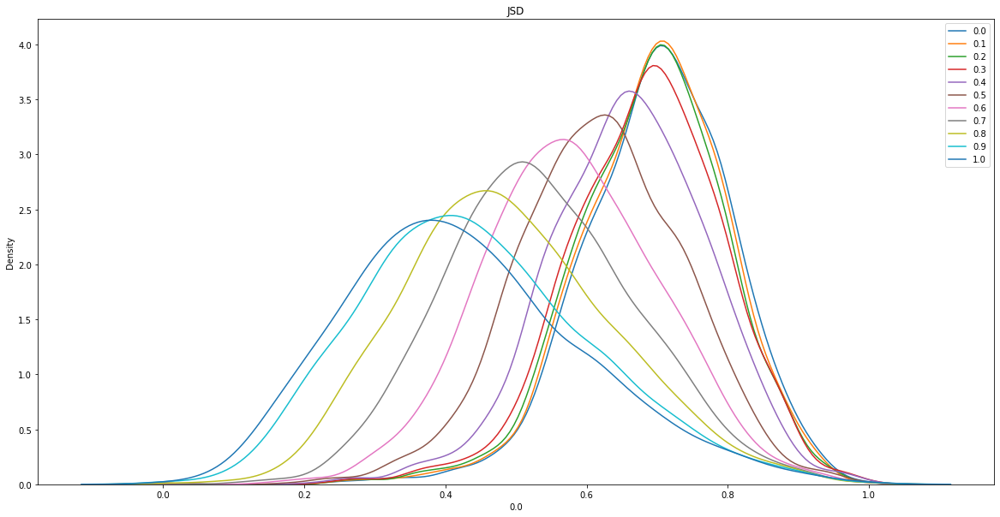

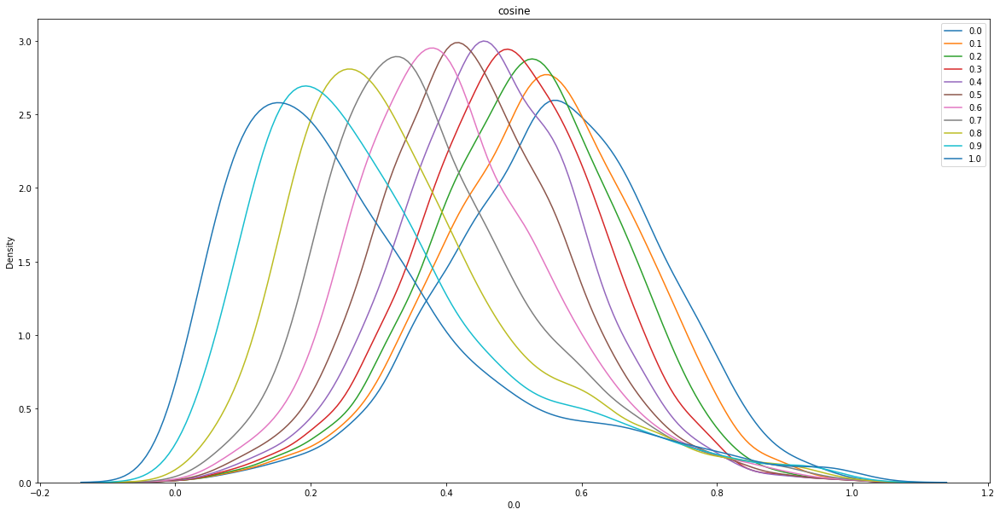

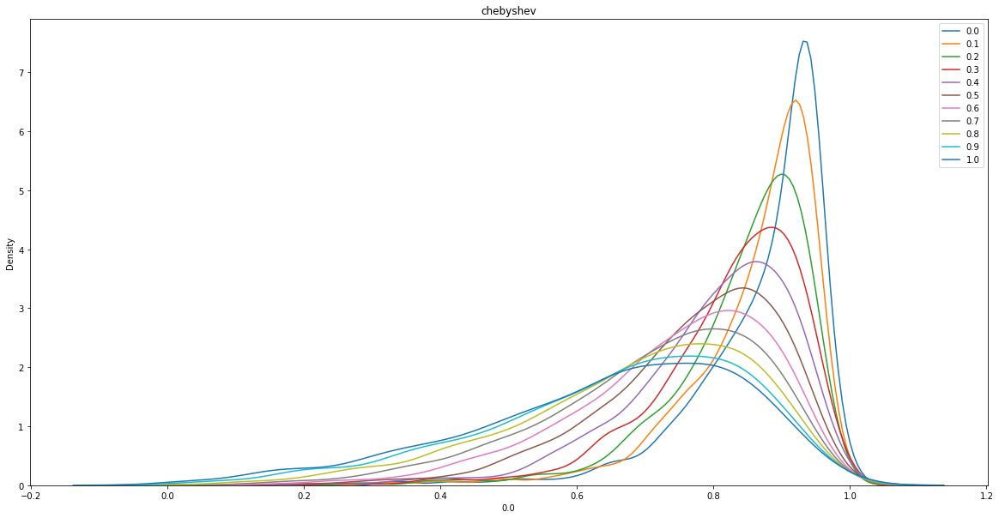

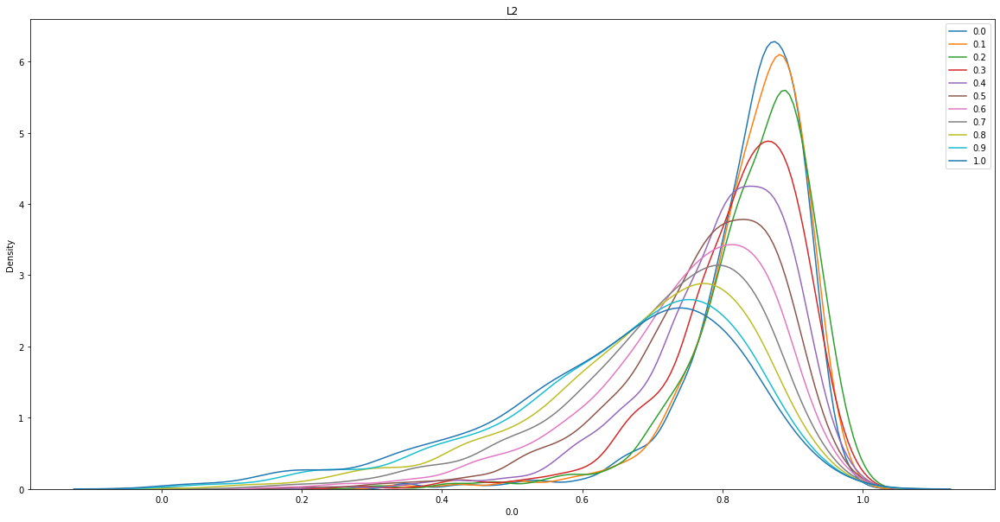

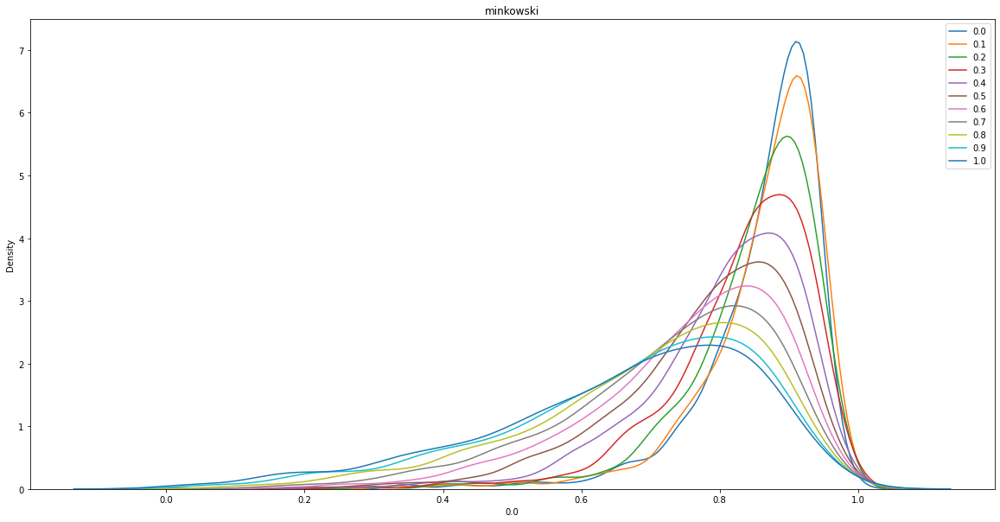

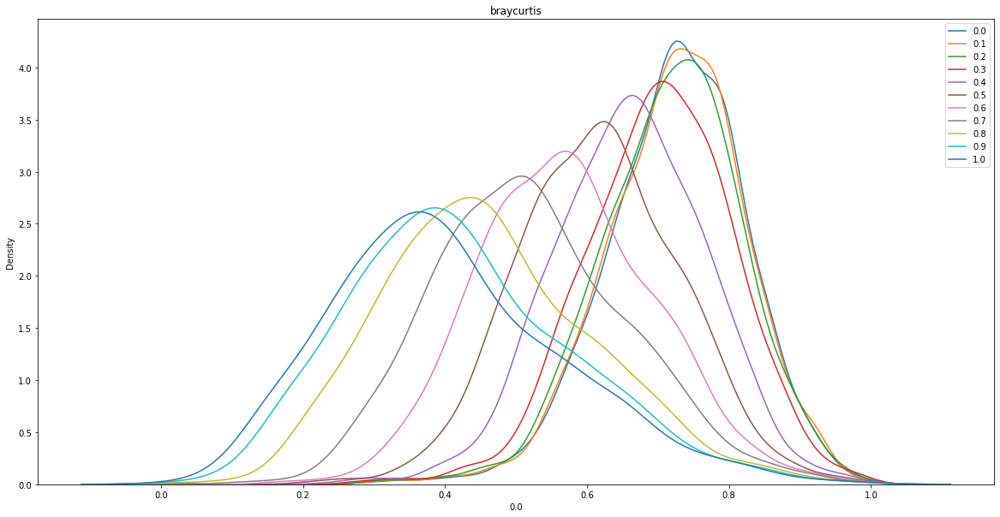

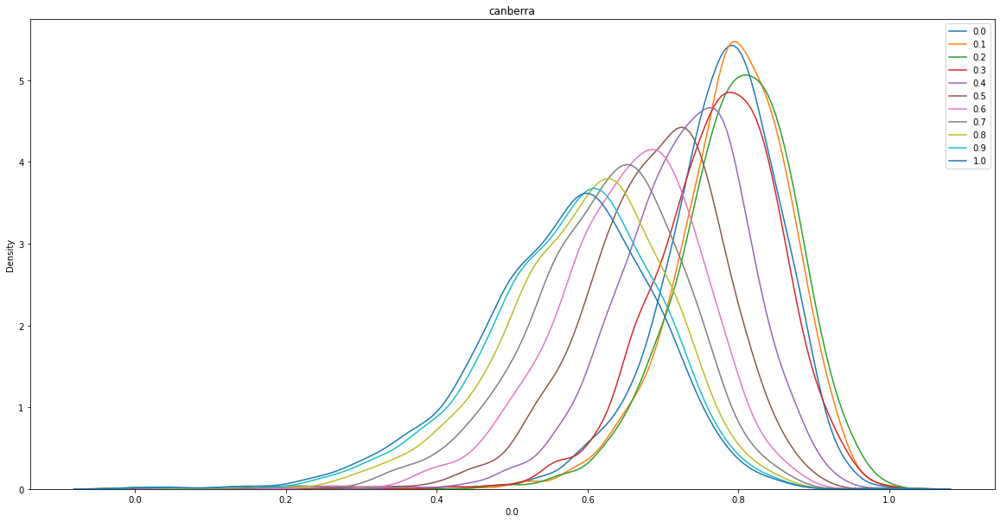

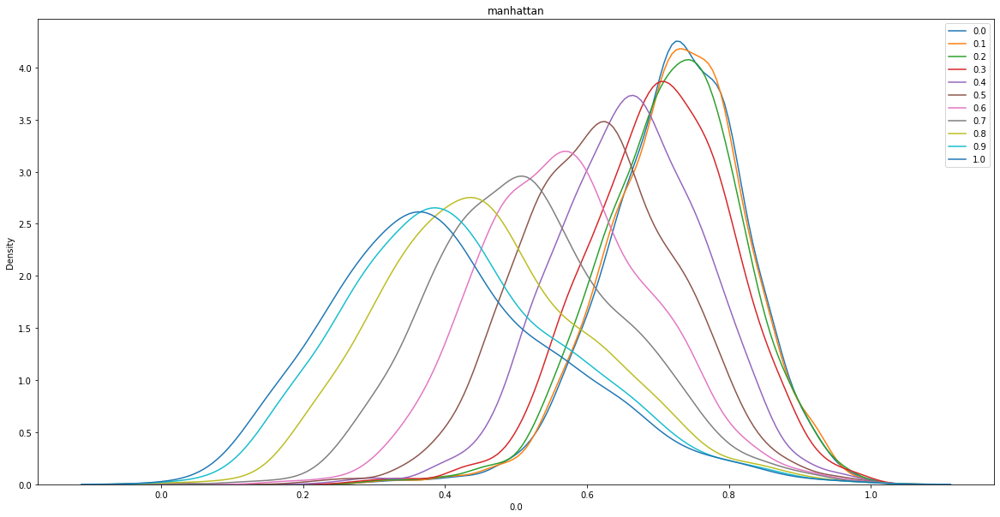

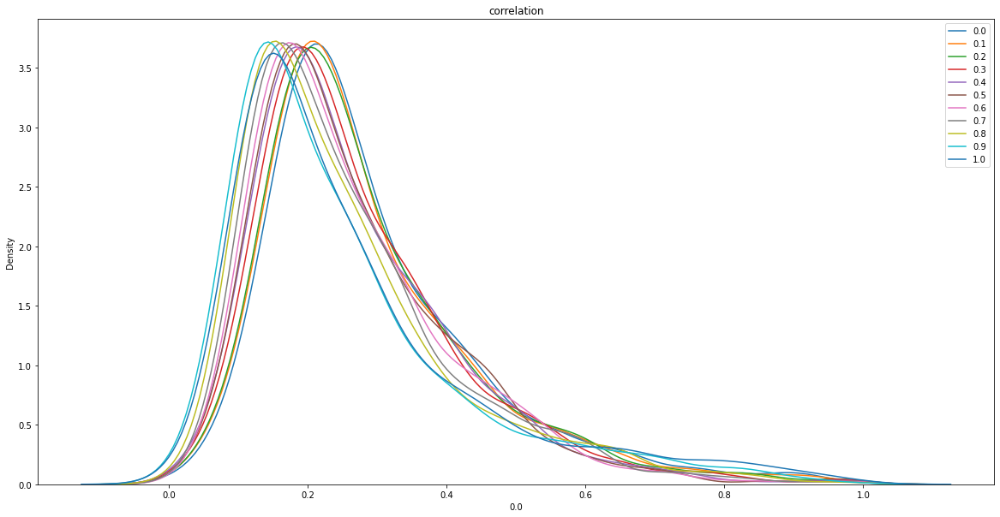

In [26]:
similarity.similarity_distribution(0, measures)

### Measure Normalisation

In [27]:
ms = {measure : [] for measure in measures}
for measure in measures:
    ms1 = similarity.most_similar_sorted(0, measure, 0.5)
    ms1 = np.array([m[1] for m in ms1])
    ms[measure] += list(ms1)

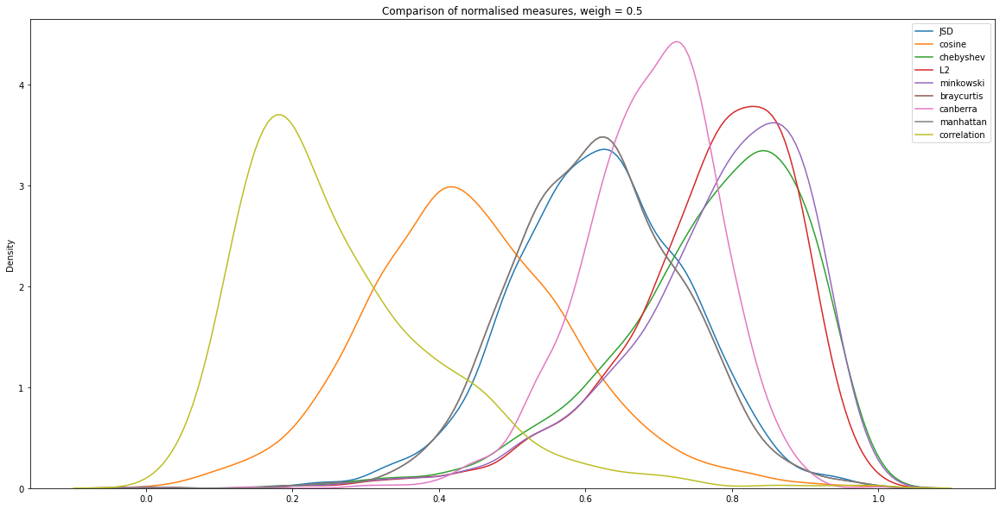

In [28]:
fig = plt.figure(1, figsize=(20, 10))
for measure in measures:
    sns.kdeplot(ms[measure], label=measure)
plt.legend() 
plt.title('Comparison of normalised measures, weigh = 0.5')
plt.show()

    We can make 5 groups
    We verify that we have superposition between Manhattan and Braycurtis curve, because they are the same on normalized data
    We will keep Manhattan

In [10]:
measures.remove('braycurtis')

### Shapiro test to see if the distribution is normal

In [30]:
for measure in measures:
    shapiro_test = stats.shapiro((ms[measure]-np.mean(ms[measure]))/np.std(ms[measure]))
    print(measure, shapiro_test)

JSD ShapiroResult(statistic=0.9959436058998108, pvalue=0.0003223267267458141)
cosine ShapiroResult(statistic=0.993545651435852, pvalue=2.2908695882506436e-06)
chebyshev ShapiroResult(statistic=0.9332811832427979, pvalue=5.815609550591233e-26)
L2 ShapiroResult(statistic=0.9232189059257507, pvalue=1.2957205035265364e-27)
minkowski ShapiroResult(statistic=0.9202452301979065, pvalue=4.532428642117506e-28)
canberra ShapiroResult(statistic=0.9720037579536438, pvalue=6.033780304506395e-17)
manhattan ShapiroResult(statistic=0.9964401125907898, pvalue=0.0010249207261949778)
correlation ShapiroResult(statistic=0.910449743270874, pvalue=1.7425626057719578e-29)


In [31]:
# generate univariate observations
# normality test
for measure in measures:
    stat, p = shapiro((ms[measure]-np.mean(ms[measure]))/np.std(ms[measure]))
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
        print('Sample looks Gaussian (fail to reject H0)')
    else:
        print('Sample does not look Gaussian (reject H0)')

Statistics=0.996, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.994, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.933, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.923, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.920, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.972, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.996, p=0.001
Sample does not look Gaussian (reject H0)
Statistics=0.910, p=0.000
Sample does not look Gaussian (reject H0)


/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


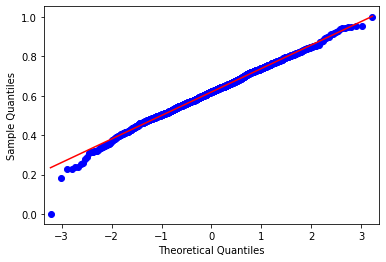

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


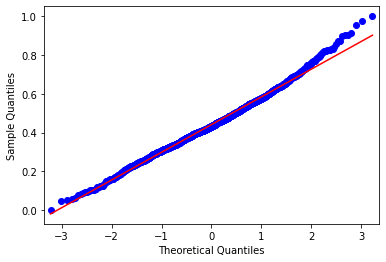

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


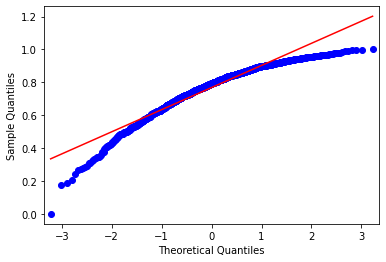

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


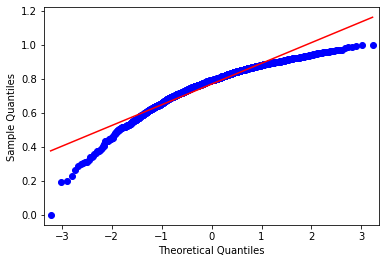

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


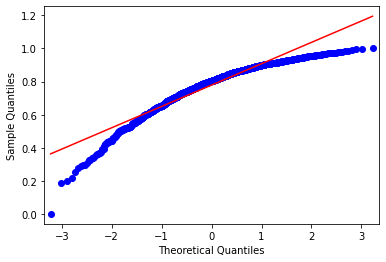

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


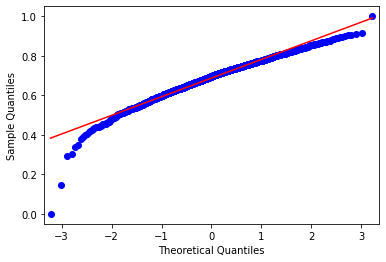

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


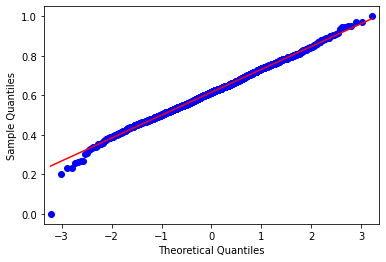

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


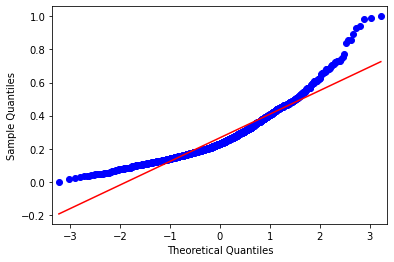

In [32]:
for measure in measures:
    qqplot(np.array(ms[measure]), line='s')
    pyplot.show()

In [11]:
weights ={measure : 0.5 for measure in measures}

In [34]:
matrix_prediction = similarity.same_prediction(weights)

step 1/431 : 0.6768631935119629sec
step 2/431 : 0.6784515380859375sec
step 3/431 : 0.666752815246582sec
step 4/431 : 0.6748754978179932sec
step 5/431 : 0.6657965183258057sec
step 6/431 : 0.6768524646759033sec
step 7/431 : 0.6652281284332275sec
step 8/431 : 0.732642412185669sec
step 9/431 : 0.6903941631317139sec
step 10/431 : 0.6657304763793945sec
step 11/431 : 0.6618010997772217sec
step 12/431 : 0.6638975143432617sec
step 13/431 : 0.6622703075408936sec
step 14/431 : 0.6642358303070068sec
step 15/431 : 0.6786808967590332sec
step 16/431 : 0.6726772785186768sec
step 17/431 : 0.6822566986083984sec
step 18/431 : 0.6739950180053711sec
step 19/431 : 0.6775436401367188sec
step 20/431 : 0.6770932674407959sec
step 21/431 : 0.6867640018463135sec
step 22/431 : 0.6689453125sec
step 23/431 : 0.666619062423706sec
step 24/431 : 0.6661849021911621sec
step 25/431 : 0.6669423580169678sec
step 26/431 : 0.6810331344604492sec
step 27/431 : 0.6829659938812256sec
step 28/431 : 0.6718857288360596sec
step 29/43

step 227/431 : 0.7596979141235352sec
step 228/431 : 0.6855823993682861sec
step 229/431 : 0.669313907623291sec
step 230/431 : 0.6661286354064941sec
step 231/431 : 0.6616072654724121sec
step 232/431 : 0.6651427745819092sec
step 233/431 : 0.667095422744751sec
step 234/431 : 0.6697747707366943sec
step 235/431 : 0.6688857078552246sec
step 236/431 : 0.6980752944946289sec
step 237/431 : 0.6674325466156006sec
step 238/431 : 0.6641330718994141sec
step 239/431 : 0.6729435920715332sec
step 240/431 : 0.6798989772796631sec
step 241/431 : 0.6684107780456543sec
step 242/431 : 0.6626758575439453sec
step 243/431 : 0.6708967685699463sec
step 244/431 : 0.6628313064575195sec
step 245/431 : 0.6606009006500244sec
step 246/431 : 0.6651053428649902sec
step 247/431 : 0.6673581600189209sec
step 248/431 : 0.6613140106201172sec
step 249/431 : 0.6610326766967773sec
step 250/431 : 0.6625058650970459sec
step 251/431 : 0.6663603782653809sec
step 252/431 : 0.6618320941925049sec
step 253/431 : 0.6686735153198242sec
ste

In [35]:
matrix_prediction

,JSD,cosine,chebyshev,L2,minkowski,canberra,manhattan,correlation
JSD,0,82274366,214718056,177530642,200914172,234076302,53521684,207277230
cosine,82274366,0,200259922,174188176,191721356,268762626,116267882,202710240
chebyshev,214718056,200259922,0,74811318,47490704,332576392,232425490,328876294
L2,177530642,174188176,74811318,0,33404150,320670308,193664492,307540020
minkowski,200914172,191721356,47490704,33404150,0,330626666,218058724,322037806
canberra,234076302,268762626,332576392,320670308,330626666,0,217977724,267780444
manhattan,53521684,116267882,232425490,193664492,218058724,217977724,0,212540896
correlation,207277230,202710240,328876294,307540020,322037806,267780444,212540896,0


In [36]:
(1-matrix_prediction/matrix_prediction.max().max()).style.background_gradient(cmap='Reds')

,JSD,cosine,chebyshev,L2,minkowski,canberra,manhattan,correlation
JSD,1.000000,0.752615,0.354380,0.466196,0.395886,0.296173,0.839070,0.376753
cosine,0.752615,1.000000,0.397853,0.476246,0.423527,0.191877,0.650402,0.390485
chebyshev,0.354380,0.397853,1.000000,0.775055,0.857204,0.000000,0.301137,0.011126
L2,0.466196,0.476246,0.775055,1.000000,0.899559,0.035800,0.417684,0.075280
minkowski,0.395886,0.423527,0.857204,0.899559,1.000000,0.005862,0.344335,0.031688
canberra,0.296173,0.191877,0.000000,0.035800,0.005862,1.000000,0.344578,0.194830
manhattan,0.839070,0.650402,0.301137,0.417684,0.344335,0.344578,1.000000,0.360926
correlation,0.376753,0.390485,0.011126,0.075280,0.031688,0.194830,0.360926,1.000000


In [37]:
(1-matrix_prediction).style.background_gradient(cmap='Reds')

,JSD,cosine,chebyshev,L2,minkowski,canberra,manhattan,correlation
JSD,1,-82274365,-214718055,-177530641,-200914171,-234076301,-53521683,-207277229
cosine,-82274365,1,-200259921,-174188175,-191721355,-268762625,-116267881,-202710239
chebyshev,-214718055,-200259921,1,-74811317,-47490703,-332576391,-232425489,-328876293
L2,-177530641,-174188175,-74811317,1,-33404149,-320670307,-193664491,-307540019
minkowski,-200914171,-191721355,-47490703,-33404149,1,-330626665,-218058723,-322037805
canberra,-234076301,-268762625,-332576391,-320670307,-330626665,1,-217977723,-267780443
manhattan,-53521683,-116267881,-232425489,-193664491,-218058723,-217977723,1,-212540895
correlation,-207277229,-202710239,-328876293,-307540019,-322037805,-267780443,-212540895,1


### Evaluation of performance

In [12]:
field, tag = similarity.evaluation(data_eval, measures)

JSD
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
cosine
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
chebyshev
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
L2
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
minkowski
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
braycurtis
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
canberra
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
manhattan
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
correlation
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0


In [13]:
classified_field_pie = {measure : [] for measure in measures}
classified_tag_pie = {measure : [] for measure in measures}
for f, t, measure in zip(field.values(), tag.values(), measures):
    print(measure)
    for weight in np.linspace(0,1,11):
        sub_field = f[f["Weight"]==weight]
        sub_tag = t[t["Weight"]==weight]
        display(sub_field.style.background_gradient(cmap="Reds"))
        display(sub_tag.style.background_gradient(cmap="Reds"))
        classified_field_pie[measure].append([sub_field['Well classified field'].sum(axis=0),sub_field['Badly classified field'].sum(axis=0)])
        classified_tag_pie[measure].append([sub_tag['Well classified tag'].sum(axis=0),sub_tag['Badly classified tag'].sum(axis=0)])

JSD


,Well classified field,Badly classified field,Weight
biologie,0.317308,0.682692,0.000000
physic,0.475000,0.525000,0.000000
computer,0.382979,0.617021,0.000000
math,0.840708,0.159292,0.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.144231,0.855769,0.000000
physic,0.125000,0.875000,0.000000
computer,0.180851,0.819149,0.000000
math,0.477876,0.522124,0.000000


,Well classified field,Badly classified field,Weight
biologie,0.673077,0.326923,0.100000
physic,0.883333,0.116667,0.100000
computer,0.531915,0.468085,0.100000
math,0.938053,0.061947,0.100000


,Well classified tag,Badly classified tag,Weight
biologie,0.461538,0.538462,0.100000
physic,0.325000,0.675000,0.100000
computer,0.265957,0.734043,0.100000
math,0.575221,0.424779,0.100000


,Well classified field,Badly classified field,Weight
biologie,0.759615,0.240385,0.200000
physic,0.908333,0.091667,0.200000
computer,0.638298,0.361702,0.200000
math,0.991150,0.008850,0.200000


,Well classified tag,Badly classified tag,Weight
biologie,0.538462,0.461538,0.200000
physic,0.366667,0.633333,0.200000
computer,0.351064,0.648936,0.200000
math,0.637168,0.362832,0.200000


,Well classified field,Badly classified field,Weight
biologie,0.788462,0.211538,0.300000
physic,0.933333,0.066667,0.300000
computer,0.680851,0.319149,0.300000
math,0.991150,0.008850,0.300000


,Well classified tag,Badly classified tag,Weight
biologie,0.586538,0.413462,0.300000
physic,0.416667,0.583333,0.300000
computer,0.393617,0.606383,0.300000
math,0.628319,0.371681,0.300000


,Well classified field,Badly classified field,Weight
biologie,0.826923,0.173077,0.400000
physic,0.950000,0.050000,0.400000
computer,0.787234,0.212766,0.400000
math,1.000000,0.000000,0.400000


,Well classified tag,Badly classified tag,Weight
biologie,0.625000,0.375000,0.400000
physic,0.466667,0.533333,0.400000
computer,0.489362,0.510638,0.400000
math,0.654867,0.345133,0.400000


,Well classified field,Badly classified field,Weight
biologie,0.855769,0.144231,0.500000
physic,0.966667,0.033333,0.500000
computer,0.808511,0.191489,0.500000
math,1.000000,0.000000,0.500000


,Well classified tag,Badly classified tag,Weight
biologie,0.653846,0.346154,0.500000
physic,0.450000,0.550000,0.500000
computer,0.500000,0.500000,0.500000
math,0.654867,0.345133,0.500000


,Well classified field,Badly classified field,Weight
biologie,0.884615,0.115385,0.600000
physic,0.966667,0.033333,0.600000
computer,0.819149,0.180851,0.600000
math,1.000000,0.000000,0.600000


,Well classified tag,Badly classified tag,Weight
biologie,0.711538,0.288462,0.600000
physic,0.475000,0.525000,0.600000
computer,0.489362,0.510638,0.600000
math,0.699115,0.300885,0.600000


,Well classified field,Badly classified field,Weight
biologie,0.884615,0.115385,0.700000
physic,0.958333,0.041667,0.700000
computer,0.840426,0.159574,0.700000
math,1.000000,0.000000,0.700000


,Well classified tag,Badly classified tag,Weight
biologie,0.730769,0.269231,0.700000
physic,0.483333,0.516667,0.700000
computer,0.489362,0.510638,0.700000
math,0.707965,0.292035,0.700000


,Well classified field,Badly classified field,Weight
biologie,0.884615,0.115385,0.800000
physic,0.958333,0.041667,0.800000
computer,0.851064,0.148936,0.800000
math,1.000000,0.000000,0.800000


,Well classified tag,Badly classified tag,Weight
biologie,0.750000,0.250000,0.800000
physic,0.491667,0.508333,0.800000
computer,0.478723,0.521277,0.800000
math,0.707965,0.292035,0.800000


,Well classified field,Badly classified field,Weight
biologie,0.884615,0.115385,0.900000
physic,0.958333,0.041667,0.900000
computer,0.829787,0.170213,0.900000
math,1.000000,0.000000,0.900000


,Well classified tag,Badly classified tag,Weight
biologie,0.740385,0.259615,0.900000
physic,0.483333,0.516667,0.900000
computer,0.489362,0.510638,0.900000
math,0.707965,0.292035,0.900000


,Well classified field,Badly classified field,Weight
biologie,0.894231,0.105769,1.000000
physic,0.958333,0.041667,1.000000
computer,0.840426,0.159574,1.000000
math,1.000000,0.000000,1.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.711538,0.288462,1.000000
physic,0.475000,0.525000,1.000000
computer,0.500000,0.500000,1.000000
math,0.725664,0.274336,1.000000


cosine


,Well classified field,Badly classified field,Weight
biologie,0.403846,0.596154,0.000000
physic,0.425000,0.575000,0.000000
computer,0.574468,0.425532,0.000000
math,0.814159,0.185841,0.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.201923,0.798077,0.000000
physic,0.075000,0.925000,0.000000
computer,0.212766,0.787234,0.000000
math,0.469027,0.530973,0.000000


,Well classified field,Badly classified field,Weight
biologie,0.711538,0.288462,0.100000
physic,0.908333,0.091667,0.100000
computer,0.670213,0.329787,0.100000
math,0.991150,0.008850,0.100000


,Well classified tag,Badly classified tag,Weight
biologie,0.442308,0.557692,0.100000
physic,0.266667,0.733333,0.100000
computer,0.340426,0.659574,0.100000
math,0.539823,0.460177,0.100000


,Well classified field,Badly classified field,Weight
biologie,0.769231,0.230769,0.200000
physic,0.925000,0.075000,0.200000
computer,0.691489,0.308511,0.200000
math,1.000000,0.000000,0.200000


,Well classified tag,Badly classified tag,Weight
biologie,0.548077,0.451923,0.200000
physic,0.375000,0.625000,0.200000
computer,0.372340,0.627660,0.200000
math,0.619469,0.380531,0.200000


,Well classified field,Badly classified field,Weight
biologie,0.807692,0.192308,0.300000
physic,0.916667,0.083333,0.300000
computer,0.787234,0.212766,0.300000
math,1.000000,0.000000,0.300000


,Well classified tag,Badly classified tag,Weight
biologie,0.634615,0.365385,0.300000
physic,0.425000,0.575000,0.300000
computer,0.478723,0.521277,0.300000
math,0.610619,0.389381,0.300000


,Well classified field,Badly classified field,Weight
biologie,0.817308,0.182692,0.400000
physic,0.908333,0.091667,0.400000
computer,0.808511,0.191489,0.400000
math,1.000000,0.000000,0.400000


,Well classified tag,Badly classified tag,Weight
biologie,0.663462,0.336538,0.400000
physic,0.433333,0.566667,0.400000
computer,0.489362,0.510638,0.400000
math,0.601770,0.398230,0.400000


,Well classified field,Badly classified field,Weight
biologie,0.798077,0.201923,0.500000
physic,0.891667,0.108333,0.500000
computer,0.819149,0.180851,0.500000
math,1.000000,0.000000,0.500000


,Well classified tag,Badly classified tag,Weight
biologie,0.663462,0.336538,0.500000
physic,0.416667,0.583333,0.500000
computer,0.489362,0.510638,0.500000
math,0.601770,0.398230,0.500000


,Well classified field,Badly classified field,Weight
biologie,0.826923,0.173077,0.600000
physic,0.900000,0.100000,0.600000
computer,0.808511,0.191489,0.600000
math,1.000000,0.000000,0.600000


,Well classified tag,Badly classified tag,Weight
biologie,0.663462,0.336538,0.600000
physic,0.408333,0.591667,0.600000
computer,0.478723,0.521277,0.600000
math,0.575221,0.424779,0.600000


,Well classified field,Badly classified field,Weight
biologie,0.846154,0.153846,0.700000
physic,0.891667,0.108333,0.700000
computer,0.829787,0.170213,0.700000
math,1.000000,0.000000,0.700000


,Well classified tag,Badly classified tag,Weight
biologie,0.644231,0.355769,0.700000
physic,0.391667,0.608333,0.700000
computer,0.468085,0.531915,0.700000
math,0.566372,0.433628,0.700000


,Well classified field,Badly classified field,Weight
biologie,0.846154,0.153846,0.800000
physic,0.900000,0.100000,0.800000
computer,0.819149,0.180851,0.800000
math,1.000000,0.000000,0.800000


,Well classified tag,Badly classified tag,Weight
biologie,0.644231,0.355769,0.800000
physic,0.416667,0.583333,0.800000
computer,0.446809,0.553191,0.800000
math,0.575221,0.424779,0.800000


,Well classified field,Badly classified field,Weight
biologie,0.875000,0.125000,0.900000
physic,0.908333,0.091667,0.900000
computer,0.829787,0.170213,0.900000
math,1.000000,0.000000,0.900000


,Well classified tag,Badly classified tag,Weight
biologie,0.721154,0.278846,0.900000
physic,0.383333,0.616667,0.900000
computer,0.446809,0.553191,0.900000
math,0.539823,0.460177,0.900000


,Well classified field,Badly classified field,Weight
biologie,0.865385,0.134615,1.000000
physic,0.908333,0.091667,1.000000
computer,0.840426,0.159574,1.000000
math,1.000000,0.000000,1.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.721154,0.278846,1.000000
physic,0.350000,0.650000,1.000000
computer,0.404255,0.595745,1.000000
math,0.584071,0.415929,1.000000


chebyshev


,Well classified field,Badly classified field,Weight
biologie,0.423077,0.576923,0.000000
physic,0.433333,0.566667,0.000000
computer,0.457447,0.542553,0.000000
math,0.672566,0.327434,0.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.221154,0.778846,0.000000
physic,0.083333,0.916667,0.000000
computer,0.170213,0.829787,0.000000
math,0.318584,0.681416,0.000000


,Well classified field,Badly classified field,Weight
biologie,0.721154,0.278846,0.100000
physic,0.883333,0.116667,0.100000
computer,0.553191,0.446809,0.100000
math,0.955752,0.044248,0.100000


,Well classified tag,Badly classified tag,Weight
biologie,0.519231,0.480769,0.100000
physic,0.366667,0.633333,0.100000
computer,0.287234,0.712766,0.100000
math,0.557522,0.442478,0.100000


,Well classified field,Badly classified field,Weight
biologie,0.682692,0.317308,0.200000
physic,0.900000,0.100000,0.200000
computer,0.723404,0.276596,0.200000
math,0.973451,0.026549,0.200000


,Well classified tag,Badly classified tag,Weight
biologie,0.538462,0.461538,0.200000
physic,0.366667,0.633333,0.200000
computer,0.393617,0.606383,0.200000
math,0.539823,0.460177,0.200000


,Well classified field,Badly classified field,Weight
biologie,0.740385,0.259615,0.300000
physic,0.908333,0.091667,0.300000
computer,0.712766,0.287234,0.300000
math,0.991150,0.008850,0.300000


,Well classified tag,Badly classified tag,Weight
biologie,0.615385,0.384615,0.300000
physic,0.358333,0.641667,0.300000
computer,0.393617,0.606383,0.300000
math,0.548673,0.451327,0.300000


,Well classified field,Badly classified field,Weight
biologie,0.798077,0.201923,0.400000
physic,0.883333,0.116667,0.400000
computer,0.723404,0.276596,0.400000
math,0.982301,0.017699,0.400000


,Well classified tag,Badly classified tag,Weight
biologie,0.663462,0.336538,0.400000
physic,0.383333,0.616667,0.400000
computer,0.393617,0.606383,0.400000
math,0.513274,0.486726,0.400000


,Well classified field,Badly classified field,Weight
biologie,0.788462,0.211538,0.500000
physic,0.883333,0.116667,0.500000
computer,0.712766,0.287234,0.500000
math,0.991150,0.008850,0.500000


,Well classified tag,Badly classified tag,Weight
biologie,0.653846,0.346154,0.500000
physic,0.400000,0.600000,0.500000
computer,0.361702,0.638298,0.500000
math,0.584071,0.415929,0.500000


,Well classified field,Badly classified field,Weight
biologie,0.798077,0.201923,0.600000
physic,0.875000,0.125000,0.600000
computer,0.712766,0.287234,0.600000
math,0.982301,0.017699,0.600000


,Well classified tag,Badly classified tag,Weight
biologie,0.673077,0.326923,0.600000
physic,0.366667,0.633333,0.600000
computer,0.361702,0.638298,0.600000
math,0.548673,0.451327,0.600000


,Well classified field,Badly classified field,Weight
biologie,0.846154,0.153846,0.700000
physic,0.883333,0.116667,0.700000
computer,0.765957,0.234043,0.700000
math,0.982301,0.017699,0.700000


,Well classified tag,Badly classified tag,Weight
biologie,0.673077,0.326923,0.700000
physic,0.350000,0.650000,0.700000
computer,0.393617,0.606383,0.700000
math,0.548673,0.451327,0.700000


,Well classified field,Badly classified field,Weight
biologie,0.846154,0.153846,0.800000
physic,0.891667,0.108333,0.800000
computer,0.776596,0.223404,0.800000
math,0.982301,0.017699,0.800000


,Well classified tag,Badly classified tag,Weight
biologie,0.644231,0.355769,0.800000
physic,0.366667,0.633333,0.800000
computer,0.414894,0.585106,0.800000
math,0.530973,0.469027,0.800000


,Well classified field,Badly classified field,Weight
biologie,0.807692,0.192308,0.900000
physic,0.891667,0.108333,0.900000
computer,0.808511,0.191489,0.900000
math,0.982301,0.017699,0.900000


,Well classified tag,Badly classified tag,Weight
biologie,0.625000,0.375000,0.900000
physic,0.341667,0.658333,0.900000
computer,0.404255,0.595745,0.900000
math,0.539823,0.460177,0.900000


,Well classified field,Badly classified field,Weight
biologie,0.798077,0.201923,1.000000
physic,0.891667,0.108333,1.000000
computer,0.787234,0.212766,1.000000
math,0.982301,0.017699,1.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.615385,0.384615,1.000000
physic,0.341667,0.658333,1.000000
computer,0.393617,0.606383,1.000000
math,0.539823,0.460177,1.000000


L2


,Well classified field,Badly classified field,Weight
biologie,0.394231,0.605769,0.000000
physic,0.425000,0.575000,0.000000
computer,0.521277,0.478723,0.000000
math,0.805310,0.194690,0.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.211538,0.788462,0.000000
physic,0.075000,0.925000,0.000000
computer,0.180851,0.819149,0.000000
math,0.469027,0.530973,0.000000


,Well classified field,Badly classified field,Weight
biologie,0.759615,0.240385,0.100000
physic,0.908333,0.091667,0.100000
computer,0.638298,0.361702,0.100000
math,0.982301,0.017699,0.100000


,Well classified tag,Badly classified tag,Weight
biologie,0.557692,0.442308,0.100000
physic,0.316667,0.683333,0.100000
computer,0.319149,0.680851,0.100000
math,0.557522,0.442478,0.100000


,Well classified field,Badly classified field,Weight
biologie,0.826923,0.173077,0.200000
physic,0.933333,0.066667,0.200000
computer,0.702128,0.297872,0.200000
math,0.982301,0.017699,0.200000


,Well classified tag,Badly classified tag,Weight
biologie,0.615385,0.384615,0.200000
physic,0.383333,0.616667,0.200000
computer,0.414894,0.585106,0.200000
math,0.601770,0.398230,0.200000


,Well classified field,Badly classified field,Weight
biologie,0.836538,0.163462,0.300000
physic,0.925000,0.075000,0.300000
computer,0.744681,0.255319,0.300000
math,1.000000,0.000000,0.300000


,Well classified tag,Badly classified tag,Weight
biologie,0.663462,0.336538,0.300000
physic,0.383333,0.616667,0.300000
computer,0.414894,0.585106,0.300000
math,0.637168,0.362832,0.300000


,Well classified field,Badly classified field,Weight
biologie,0.826923,0.173077,0.400000
physic,0.925000,0.075000,0.400000
computer,0.734043,0.265957,0.400000
math,0.991150,0.008850,0.400000


,Well classified tag,Badly classified tag,Weight
biologie,0.653846,0.346154,0.400000
physic,0.425000,0.575000,0.400000
computer,0.393617,0.606383,0.400000
math,0.619469,0.380531,0.400000


,Well classified field,Badly classified field,Weight
biologie,0.817308,0.182692,0.500000
physic,0.908333,0.091667,0.500000
computer,0.765957,0.234043,0.500000
math,0.991150,0.008850,0.500000


,Well classified tag,Badly classified tag,Weight
biologie,0.634615,0.365385,0.500000
physic,0.408333,0.591667,0.500000
computer,0.404255,0.595745,0.500000
math,0.584071,0.415929,0.500000


,Well classified field,Badly classified field,Weight
biologie,0.855769,0.144231,0.600000
physic,0.900000,0.100000,0.600000
computer,0.755319,0.244681,0.600000
math,0.991150,0.008850,0.600000


,Well classified tag,Badly classified tag,Weight
biologie,0.634615,0.365385,0.600000
physic,0.408333,0.591667,0.600000
computer,0.382979,0.617021,0.600000
math,0.619469,0.380531,0.600000


,Well classified field,Badly classified field,Weight
biologie,0.865385,0.134615,0.700000
physic,0.883333,0.116667,0.700000
computer,0.776596,0.223404,0.700000
math,0.991150,0.008850,0.700000


,Well classified tag,Badly classified tag,Weight
biologie,0.653846,0.346154,0.700000
physic,0.383333,0.616667,0.700000
computer,0.414894,0.585106,0.700000
math,0.637168,0.362832,0.700000


,Well classified field,Badly classified field,Weight
biologie,0.875000,0.125000,0.800000
physic,0.891667,0.108333,0.800000
computer,0.797872,0.202128,0.800000
math,0.991150,0.008850,0.800000


,Well classified tag,Badly classified tag,Weight
biologie,0.653846,0.346154,0.800000
physic,0.383333,0.616667,0.800000
computer,0.425532,0.574468,0.800000
math,0.610619,0.389381,0.800000


,Well classified field,Badly classified field,Weight
biologie,0.865385,0.134615,0.900000
physic,0.891667,0.108333,0.900000
computer,0.797872,0.202128,0.900000
math,0.991150,0.008850,0.900000


,Well classified tag,Badly classified tag,Weight
biologie,0.663462,0.336538,0.900000
physic,0.383333,0.616667,0.900000
computer,0.404255,0.595745,0.900000
math,0.637168,0.362832,0.900000


,Well classified field,Badly classified field,Weight
biologie,0.865385,0.134615,1.000000
physic,0.900000,0.100000,1.000000
computer,0.808511,0.191489,1.000000
math,0.991150,0.008850,1.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.653846,0.346154,1.000000
physic,0.375000,0.625000,1.000000
computer,0.393617,0.606383,1.000000
math,0.646018,0.353982,1.000000


minkowski


,Well classified field,Badly classified field,Weight
biologie,0.413462,0.586538,0.000000
physic,0.450000,0.550000,0.000000
computer,0.521277,0.478723,0.000000
math,0.778761,0.221239,0.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.269231,0.730769,0.000000
physic,0.091667,0.908333,0.000000
computer,0.180851,0.819149,0.000000
math,0.424779,0.575221,0.000000


,Well classified field,Badly classified field,Weight
biologie,0.740385,0.259615,0.100000
physic,0.908333,0.091667,0.100000
computer,0.606383,0.393617,0.100000
math,0.973451,0.026549,0.100000


,Well classified tag,Badly classified tag,Weight
biologie,0.519231,0.480769,0.100000
physic,0.291667,0.708333,0.100000
computer,0.351064,0.648936,0.100000
math,0.530973,0.469027,0.100000


,Well classified field,Badly classified field,Weight
biologie,0.759615,0.240385,0.200000
physic,0.916667,0.083333,0.200000
computer,0.734043,0.265957,0.200000
math,0.982301,0.017699,0.200000


,Well classified tag,Badly classified tag,Weight
biologie,0.596154,0.403846,0.200000
physic,0.375000,0.625000,0.200000
computer,0.414894,0.585106,0.200000
math,0.584071,0.415929,0.200000


,Well classified field,Badly classified field,Weight
biologie,0.807692,0.192308,0.300000
physic,0.908333,0.091667,0.300000
computer,0.765957,0.234043,0.300000
math,1.000000,0.000000,0.300000


,Well classified tag,Badly classified tag,Weight
biologie,0.653846,0.346154,0.300000
physic,0.416667,0.583333,0.300000
computer,0.404255,0.595745,0.300000
math,0.601770,0.398230,0.300000


,Well classified field,Badly classified field,Weight
biologie,0.826923,0.173077,0.400000
physic,0.916667,0.083333,0.400000
computer,0.776596,0.223404,0.400000
math,0.991150,0.008850,0.400000


,Well classified tag,Badly classified tag,Weight
biologie,0.634615,0.365385,0.400000
physic,0.408333,0.591667,0.400000
computer,0.382979,0.617021,0.400000
math,0.584071,0.415929,0.400000


,Well classified field,Badly classified field,Weight
biologie,0.836538,0.163462,0.500000
physic,0.916667,0.083333,0.500000
computer,0.787234,0.212766,0.500000
math,0.991150,0.008850,0.500000


,Well classified tag,Badly classified tag,Weight
biologie,0.644231,0.355769,0.500000
physic,0.408333,0.591667,0.500000
computer,0.414894,0.585106,0.500000
math,0.601770,0.398230,0.500000


,Well classified field,Badly classified field,Weight
biologie,0.855769,0.144231,0.600000
physic,0.900000,0.100000,0.600000
computer,0.755319,0.244681,0.600000
math,0.991150,0.008850,0.600000


,Well classified tag,Badly classified tag,Weight
biologie,0.653846,0.346154,0.600000
physic,0.383333,0.616667,0.600000
computer,0.404255,0.595745,0.600000
math,0.610619,0.389381,0.600000


,Well classified field,Badly classified field,Weight
biologie,0.855769,0.144231,0.700000
physic,0.908333,0.091667,0.700000
computer,0.797872,0.202128,0.700000
math,0.991150,0.008850,0.700000


,Well classified tag,Badly classified tag,Weight
biologie,0.673077,0.326923,0.700000
physic,0.375000,0.625000,0.700000
computer,0.425532,0.574468,0.700000
math,0.637168,0.362832,0.700000


,Well classified field,Badly classified field,Weight
biologie,0.855769,0.144231,0.800000
physic,0.900000,0.100000,0.800000
computer,0.787234,0.212766,0.800000
math,0.991150,0.008850,0.800000


,Well classified tag,Badly classified tag,Weight
biologie,0.682692,0.317308,0.800000
physic,0.366667,0.633333,0.800000
computer,0.425532,0.574468,0.800000
math,0.601770,0.398230,0.800000


,Well classified field,Badly classified field,Weight
biologie,0.855769,0.144231,0.900000
physic,0.900000,0.100000,0.900000
computer,0.797872,0.202128,0.900000
math,0.991150,0.008850,0.900000


,Well classified tag,Badly classified tag,Weight
biologie,0.682692,0.317308,0.900000
physic,0.375000,0.625000,0.900000
computer,0.414894,0.585106,0.900000
math,0.601770,0.398230,0.900000


,Well classified field,Badly classified field,Weight
biologie,0.836538,0.163462,1.000000
physic,0.891667,0.108333,1.000000
computer,0.797872,0.202128,1.000000
math,0.991150,0.008850,1.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.653846,0.346154,1.000000
physic,0.358333,0.641667,1.000000
computer,0.404255,0.595745,1.000000
math,0.619469,0.380531,1.000000


braycurtis


,Well classified field,Badly classified field,Weight
biologie,0.375000,0.625000,0.000000
physic,0.533333,0.466667,0.000000
computer,0.372340,0.627660,0.000000
math,0.840708,0.159292,0.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.211538,0.788462,0.000000
physic,0.175000,0.825000,0.000000
computer,0.202128,0.797872,0.000000
math,0.495575,0.504425,0.000000


,Well classified field,Badly classified field,Weight
biologie,0.682692,0.317308,0.100000
physic,0.900000,0.100000,0.100000
computer,0.585106,0.414894,0.100000
math,0.982301,0.017699,0.100000


,Well classified tag,Badly classified tag,Weight
biologie,0.451923,0.548077,0.100000
physic,0.308333,0.691667,0.100000
computer,0.308511,0.691489,0.100000
math,0.601770,0.398230,0.100000


,Well classified field,Badly classified field,Weight
biologie,0.788462,0.211538,0.200000
physic,0.950000,0.050000,0.200000
computer,0.627660,0.372340,0.200000
math,0.991150,0.008850,0.200000


,Well classified tag,Badly classified tag,Weight
biologie,0.605769,0.394231,0.200000
physic,0.366667,0.633333,0.200000
computer,0.351064,0.648936,0.200000
math,0.601770,0.398230,0.200000


,Well classified field,Badly classified field,Weight
biologie,0.826923,0.173077,0.300000
physic,0.925000,0.075000,0.300000
computer,0.702128,0.297872,0.300000
math,0.991150,0.008850,0.300000


,Well classified tag,Badly classified tag,Weight
biologie,0.653846,0.346154,0.300000
physic,0.358333,0.641667,0.300000
computer,0.372340,0.627660,0.300000
math,0.628319,0.371681,0.300000


,Well classified field,Badly classified field,Weight
biologie,0.855769,0.144231,0.400000
physic,0.925000,0.075000,0.400000
computer,0.776596,0.223404,0.400000
math,1.000000,0.000000,0.400000


,Well classified tag,Badly classified tag,Weight
biologie,0.682692,0.317308,0.400000
physic,0.416667,0.583333,0.400000
computer,0.404255,0.595745,0.400000
math,0.654867,0.345133,0.400000


,Well classified field,Badly classified field,Weight
biologie,0.875000,0.125000,0.500000
physic,0.933333,0.066667,0.500000
computer,0.808511,0.191489,0.500000
math,1.000000,0.000000,0.500000


,Well classified tag,Badly classified tag,Weight
biologie,0.673077,0.326923,0.500000
physic,0.441667,0.558333,0.500000
computer,0.436170,0.563830,0.500000
math,0.663717,0.336283,0.500000


,Well classified field,Badly classified field,Weight
biologie,0.884615,0.115385,0.600000
physic,0.958333,0.041667,0.600000
computer,0.829787,0.170213,0.600000
math,1.000000,0.000000,0.600000


,Well classified tag,Badly classified tag,Weight
biologie,0.692308,0.307692,0.600000
physic,0.441667,0.558333,0.600000
computer,0.457447,0.542553,0.600000
math,0.637168,0.362832,0.600000


,Well classified field,Badly classified field,Weight
biologie,0.875000,0.125000,0.700000
physic,0.950000,0.050000,0.700000
computer,0.840426,0.159574,0.700000
math,1.000000,0.000000,0.700000


,Well classified tag,Badly classified tag,Weight
biologie,0.692308,0.307692,0.700000
physic,0.466667,0.533333,0.700000
computer,0.468085,0.531915,0.700000
math,0.637168,0.362832,0.700000


,Well classified field,Badly classified field,Weight
biologie,0.894231,0.105769,0.800000
physic,0.941667,0.058333,0.800000
computer,0.861702,0.138298,0.800000
math,1.000000,0.000000,0.800000


,Well classified tag,Badly classified tag,Weight
biologie,0.721154,0.278846,0.800000
physic,0.450000,0.550000,0.800000
computer,0.457447,0.542553,0.800000
math,0.654867,0.345133,0.800000


,Well classified field,Badly classified field,Weight
biologie,0.894231,0.105769,0.900000
physic,0.941667,0.058333,0.900000
computer,0.840426,0.159574,0.900000
math,1.000000,0.000000,0.900000


,Well classified tag,Badly classified tag,Weight
biologie,0.730769,0.269231,0.900000
physic,0.450000,0.550000,0.900000
computer,0.425532,0.574468,0.900000
math,0.716814,0.283186,0.900000


,Well classified field,Badly classified field,Weight
biologie,0.894231,0.105769,1.000000
physic,0.941667,0.058333,1.000000
computer,0.840426,0.159574,1.000000
math,1.000000,0.000000,1.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.711538,0.288462,1.000000
physic,0.441667,0.558333,1.000000
computer,0.446809,0.553191,1.000000
math,0.699115,0.300885,1.000000


canberra


,Well classified field,Badly classified field,Weight
biologie,0.403846,0.596154,0.000000
physic,0.516667,0.483333,0.000000
computer,0.372340,0.627660,0.000000
math,0.867257,0.132743,0.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.221154,0.778846,0.000000
physic,0.166667,0.833333,0.000000
computer,0.127660,0.872340,0.000000
math,0.469027,0.530973,0.000000


,Well classified field,Badly classified field,Weight
biologie,0.538462,0.461538,0.100000
physic,0.700000,0.300000,0.100000
computer,0.425532,0.574468,0.100000
math,0.991150,0.008850,0.100000


,Well classified tag,Badly classified tag,Weight
biologie,0.365385,0.634615,0.100000
physic,0.316667,0.683333,0.100000
computer,0.212766,0.787234,0.100000
math,0.530973,0.469027,0.100000


,Well classified field,Badly classified field,Weight
biologie,0.625000,0.375000,0.200000
physic,0.816667,0.183333,0.200000
computer,0.531915,0.468085,0.200000
math,0.982301,0.017699,0.200000


,Well classified tag,Badly classified tag,Weight
biologie,0.451923,0.548077,0.200000
physic,0.375000,0.625000,0.200000
computer,0.287234,0.712766,0.200000
math,0.557522,0.442478,0.200000


,Well classified field,Badly classified field,Weight
biologie,0.596154,0.403846,0.300000
physic,0.875000,0.125000,0.300000
computer,0.595745,0.404255,0.300000
math,0.991150,0.008850,0.300000


,Well classified tag,Badly classified tag,Weight
biologie,0.403846,0.596154,0.300000
physic,0.391667,0.608333,0.300000
computer,0.319149,0.680851,0.300000
math,0.548673,0.451327,0.300000


,Well classified field,Badly classified field,Weight
biologie,0.625000,0.375000,0.400000
physic,0.900000,0.100000,0.400000
computer,0.585106,0.414894,0.400000
math,1.000000,0.000000,0.400000


,Well classified tag,Badly classified tag,Weight
biologie,0.423077,0.576923,0.400000
physic,0.408333,0.591667,0.400000
computer,0.319149,0.680851,0.400000
math,0.601770,0.398230,0.400000


,Well classified field,Badly classified field,Weight
biologie,0.634615,0.365385,0.500000
physic,0.891667,0.108333,0.500000
computer,0.574468,0.425532,0.500000
math,1.000000,0.000000,0.500000


,Well classified tag,Badly classified tag,Weight
biologie,0.403846,0.596154,0.500000
physic,0.416667,0.583333,0.500000
computer,0.308511,0.691489,0.500000
math,0.575221,0.424779,0.500000


,Well classified field,Badly classified field,Weight
biologie,0.605769,0.394231,0.600000
physic,0.858333,0.141667,0.600000
computer,0.574468,0.425532,0.600000
math,1.000000,0.000000,0.600000


,Well classified tag,Badly classified tag,Weight
biologie,0.403846,0.596154,0.600000
physic,0.425000,0.575000,0.600000
computer,0.308511,0.691489,0.600000
math,0.610619,0.389381,0.600000


,Well classified field,Badly classified field,Weight
biologie,0.644231,0.355769,0.700000
physic,0.866667,0.133333,0.700000
computer,0.595745,0.404255,0.700000
math,1.000000,0.000000,0.700000


,Well classified tag,Badly classified tag,Weight
biologie,0.451923,0.548077,0.700000
physic,0.416667,0.583333,0.700000
computer,0.329787,0.670213,0.700000
math,0.628319,0.371681,0.700000


,Well classified field,Badly classified field,Weight
biologie,0.653846,0.346154,0.800000
physic,0.858333,0.141667,0.800000
computer,0.574468,0.425532,0.800000
math,1.000000,0.000000,0.800000


,Well classified tag,Badly classified tag,Weight
biologie,0.451923,0.548077,0.800000
physic,0.400000,0.600000,0.800000
computer,0.329787,0.670213,0.800000
math,0.628319,0.371681,0.800000


,Well classified field,Badly classified field,Weight
biologie,0.653846,0.346154,0.900000
physic,0.858333,0.141667,0.900000
computer,0.563830,0.436170,0.900000
math,1.000000,0.000000,0.900000


,Well classified tag,Badly classified tag,Weight
biologie,0.451923,0.548077,0.900000
physic,0.383333,0.616667,0.900000
computer,0.329787,0.670213,0.900000
math,0.619469,0.380531,0.900000


,Well classified field,Badly classified field,Weight
biologie,0.663462,0.336538,1.000000
physic,0.858333,0.141667,1.000000
computer,0.563830,0.436170,1.000000
math,1.000000,0.000000,1.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.471154,0.528846,1.000000
physic,0.375000,0.625000,1.000000
computer,0.329787,0.670213,1.000000
math,0.619469,0.380531,1.000000


manhattan


,Well classified field,Badly classified field,Weight
biologie,0.375000,0.625000,0.000000
physic,0.533333,0.466667,0.000000
computer,0.372340,0.627660,0.000000
math,0.840708,0.159292,0.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.211538,0.788462,0.000000
physic,0.175000,0.825000,0.000000
computer,0.202128,0.797872,0.000000
math,0.495575,0.504425,0.000000


,Well classified field,Badly classified field,Weight
biologie,0.682692,0.317308,0.100000
physic,0.900000,0.100000,0.100000
computer,0.585106,0.414894,0.100000
math,0.982301,0.017699,0.100000


,Well classified tag,Badly classified tag,Weight
biologie,0.451923,0.548077,0.100000
physic,0.308333,0.691667,0.100000
computer,0.308511,0.691489,0.100000
math,0.601770,0.398230,0.100000


,Well classified field,Badly classified field,Weight
biologie,0.788462,0.211538,0.200000
physic,0.950000,0.050000,0.200000
computer,0.627660,0.372340,0.200000
math,0.991150,0.008850,0.200000


,Well classified tag,Badly classified tag,Weight
biologie,0.605769,0.394231,0.200000
physic,0.366667,0.633333,0.200000
computer,0.351064,0.648936,0.200000
math,0.601770,0.398230,0.200000


,Well classified field,Badly classified field,Weight
biologie,0.826923,0.173077,0.300000
physic,0.925000,0.075000,0.300000
computer,0.702128,0.297872,0.300000
math,0.991150,0.008850,0.300000


,Well classified tag,Badly classified tag,Weight
biologie,0.653846,0.346154,0.300000
physic,0.358333,0.641667,0.300000
computer,0.372340,0.627660,0.300000
math,0.628319,0.371681,0.300000


,Well classified field,Badly classified field,Weight
biologie,0.855769,0.144231,0.400000
physic,0.925000,0.075000,0.400000
computer,0.776596,0.223404,0.400000
math,1.000000,0.000000,0.400000


,Well classified tag,Badly classified tag,Weight
biologie,0.682692,0.317308,0.400000
physic,0.416667,0.583333,0.400000
computer,0.404255,0.595745,0.400000
math,0.654867,0.345133,0.400000


,Well classified field,Badly classified field,Weight
biologie,0.875000,0.125000,0.500000
physic,0.933333,0.066667,0.500000
computer,0.808511,0.191489,0.500000
math,1.000000,0.000000,0.500000


,Well classified tag,Badly classified tag,Weight
biologie,0.673077,0.326923,0.500000
physic,0.441667,0.558333,0.500000
computer,0.436170,0.563830,0.500000
math,0.663717,0.336283,0.500000


,Well classified field,Badly classified field,Weight
biologie,0.884615,0.115385,0.600000
physic,0.958333,0.041667,0.600000
computer,0.829787,0.170213,0.600000
math,1.000000,0.000000,0.600000


,Well classified tag,Badly classified tag,Weight
biologie,0.692308,0.307692,0.600000
physic,0.441667,0.558333,0.600000
computer,0.457447,0.542553,0.600000
math,0.637168,0.362832,0.600000


,Well classified field,Badly classified field,Weight
biologie,0.875000,0.125000,0.700000
physic,0.950000,0.050000,0.700000
computer,0.840426,0.159574,0.700000
math,1.000000,0.000000,0.700000


,Well classified tag,Badly classified tag,Weight
biologie,0.692308,0.307692,0.700000
physic,0.466667,0.533333,0.700000
computer,0.468085,0.531915,0.700000
math,0.637168,0.362832,0.700000


,Well classified field,Badly classified field,Weight
biologie,0.894231,0.105769,0.800000
physic,0.941667,0.058333,0.800000
computer,0.861702,0.138298,0.800000
math,1.000000,0.000000,0.800000


,Well classified tag,Badly classified tag,Weight
biologie,0.721154,0.278846,0.800000
physic,0.450000,0.550000,0.800000
computer,0.457447,0.542553,0.800000
math,0.654867,0.345133,0.800000


,Well classified field,Badly classified field,Weight
biologie,0.894231,0.105769,0.900000
physic,0.941667,0.058333,0.900000
computer,0.840426,0.159574,0.900000
math,1.000000,0.000000,0.900000


,Well classified tag,Badly classified tag,Weight
biologie,0.730769,0.269231,0.900000
physic,0.450000,0.550000,0.900000
computer,0.425532,0.574468,0.900000
math,0.716814,0.283186,0.900000


,Well classified field,Badly classified field,Weight
biologie,0.894231,0.105769,1.000000
physic,0.941667,0.058333,1.000000
computer,0.840426,0.159574,1.000000
math,1.000000,0.000000,1.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.711538,0.288462,1.000000
physic,0.441667,0.558333,1.000000
computer,0.446809,0.553191,1.000000
math,0.699115,0.300885,1.000000


correlation


,Well classified field,Badly classified field,Weight
biologie,0.490385,0.509615,0.000000
physic,0.508333,0.491667,0.000000
computer,0.638298,0.361702,0.000000
math,0.787611,0.212389,0.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.336538,0.663462,0.000000
physic,0.083333,0.916667,0.000000
computer,0.255319,0.744681,0.000000
math,0.539823,0.460177,0.000000


,Well classified field,Badly classified field,Weight
biologie,0.586538,0.413462,0.100000
physic,0.750000,0.250000,0.100000
computer,0.670213,0.329787,0.100000
math,0.911504,0.088496,0.100000


,Well classified tag,Badly classified tag,Weight
biologie,0.432692,0.567308,0.100000
physic,0.183333,0.816667,0.100000
computer,0.319149,0.680851,0.100000
math,0.610619,0.389381,0.100000


,Well classified field,Badly classified field,Weight
biologie,0.663462,0.336538,0.200000
physic,0.850000,0.150000,0.200000
computer,0.712766,0.287234,0.200000
math,0.964602,0.035398,0.200000


,Well classified tag,Badly classified tag,Weight
biologie,0.480769,0.519231,0.200000
physic,0.216667,0.783333,0.200000
computer,0.361702,0.638298,0.200000
math,0.672566,0.327434,0.200000


,Well classified field,Badly classified field,Weight
biologie,0.692308,0.307692,0.300000
physic,0.891667,0.108333,0.300000
computer,0.744681,0.255319,0.300000
math,0.991150,0.008850,0.300000


,Well classified tag,Badly classified tag,Weight
biologie,0.596154,0.403846,0.300000
physic,0.241667,0.758333,0.300000
computer,0.372340,0.627660,0.300000
math,0.681416,0.318584,0.300000


,Well classified field,Badly classified field,Weight
biologie,0.788462,0.211538,0.400000
physic,0.916667,0.083333,0.400000
computer,0.776596,0.223404,0.400000
math,1.000000,0.000000,0.400000


,Well classified tag,Badly classified tag,Weight
biologie,0.692308,0.307692,0.400000
physic,0.308333,0.691667,0.400000
computer,0.446809,0.553191,0.400000
math,0.663717,0.336283,0.400000


,Well classified field,Badly classified field,Weight
biologie,0.826923,0.173077,0.500000
physic,0.916667,0.083333,0.500000
computer,0.808511,0.191489,0.500000
math,1.000000,0.000000,0.500000


,Well classified tag,Badly classified tag,Weight
biologie,0.701923,0.298077,0.500000
physic,0.325000,0.675000,0.500000
computer,0.468085,0.531915,0.500000
math,0.699115,0.300885,0.500000


,Well classified field,Badly classified field,Weight
biologie,0.846154,0.153846,0.600000
physic,0.916667,0.083333,0.600000
computer,0.829787,0.170213,0.600000
math,1.000000,0.000000,0.600000


,Well classified tag,Badly classified tag,Weight
biologie,0.730769,0.269231,0.600000
physic,0.341667,0.658333,0.600000
computer,0.468085,0.531915,0.600000
math,0.690265,0.309735,0.600000


,Well classified field,Badly classified field,Weight
biologie,0.817308,0.182692,0.700000
physic,0.916667,0.083333,0.700000
computer,0.829787,0.170213,0.700000
math,1.000000,0.000000,0.700000


,Well classified tag,Badly classified tag,Weight
biologie,0.711538,0.288462,0.700000
physic,0.366667,0.633333,0.700000
computer,0.468085,0.531915,0.700000
math,0.672566,0.327434,0.700000


,Well classified field,Badly classified field,Weight
biologie,0.836538,0.163462,0.800000
physic,0.900000,0.100000,0.800000
computer,0.819149,0.180851,0.800000
math,1.000000,0.000000,0.800000


,Well classified tag,Badly classified tag,Weight
biologie,0.663462,0.336538,0.800000
physic,0.383333,0.616667,0.800000
computer,0.468085,0.531915,0.800000
math,0.690265,0.309735,0.800000


,Well classified field,Badly classified field,Weight
biologie,0.846154,0.153846,0.900000
physic,0.900000,0.100000,0.900000
computer,0.840426,0.159574,0.900000
math,1.000000,0.000000,0.900000


,Well classified tag,Badly classified tag,Weight
biologie,0.701923,0.298077,0.900000
physic,0.341667,0.658333,0.900000
computer,0.457447,0.542553,0.900000
math,0.672566,0.327434,0.900000


,Well classified field,Badly classified field,Weight
biologie,0.855769,0.144231,1.000000
physic,0.900000,0.100000,1.000000
computer,0.819149,0.180851,1.000000
math,1.000000,0.000000,1.000000


,Well classified tag,Badly classified tag,Weight
biologie,0.701923,0.298077,1.000000
physic,0.341667,0.658333,1.000000
computer,0.404255,0.595745,1.000000
math,0.592920,0.407080,1.000000


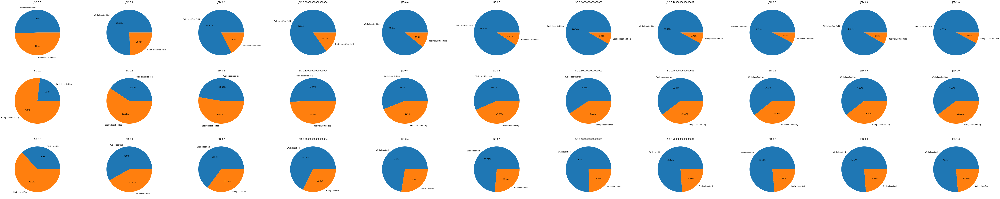

************************************************************************************************************************


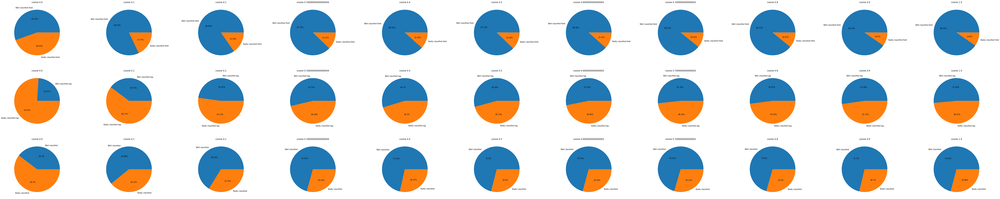

************************************************************************************************************************


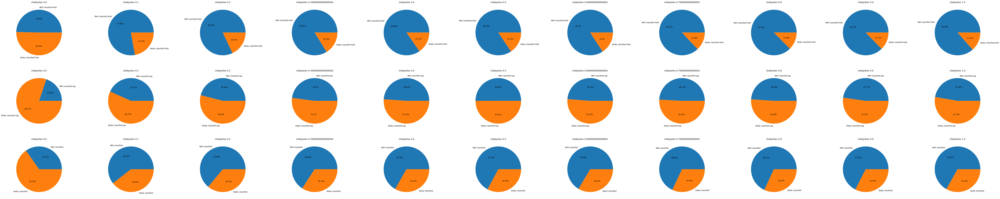

************************************************************************************************************************


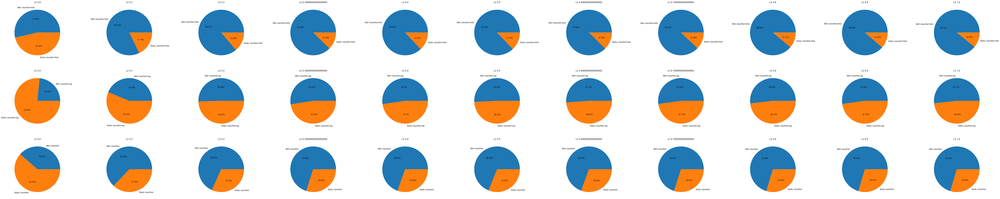

************************************************************************************************************************


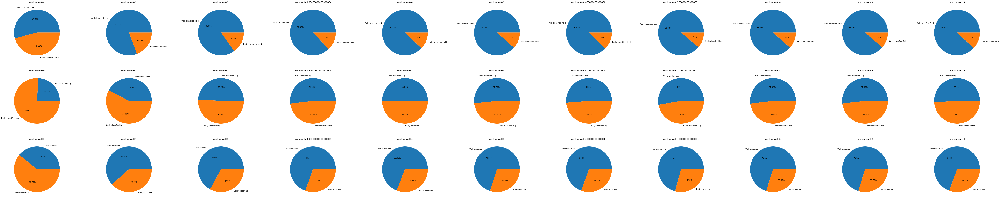

************************************************************************************************************************


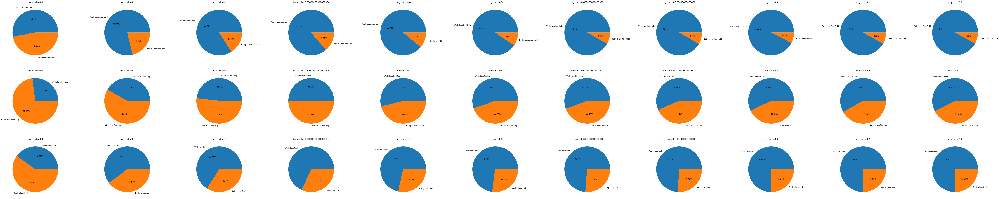

************************************************************************************************************************


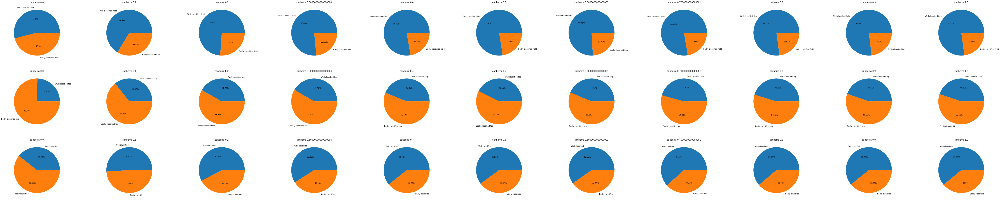

************************************************************************************************************************


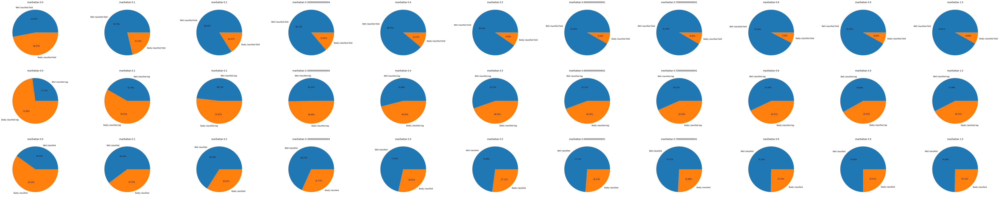

************************************************************************************************************************


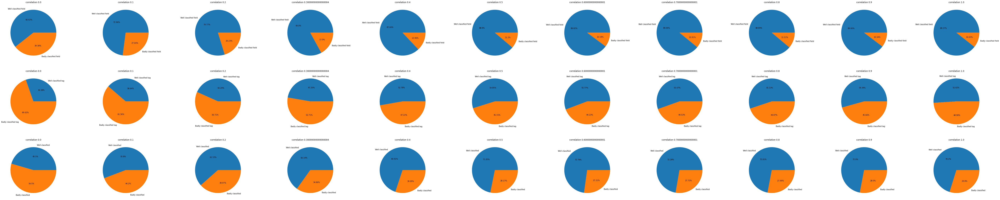

************************************************************************************************************************


In [14]:
for measure in measures:
    
    # create a figure with two subplots
    fig, ax = plt.subplots(3,11, figsize=(100, 20))
    
    # plot each pie chart in a separate subplot
    for j, weight in enumerate(np.linspace(0,1,11)):
        ax[0][j].pie(classified_field_pie[measure][j], labels = ["Well classified field","Badly classified field"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[0][j].set_title(measure + " " + str(weight))
        ax[1][j].pie(classified_tag_pie[measure][j], labels = ["Well classified tag","Badly classified tag"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[1][j].set_title(measure + " " + str(weight))
        ax[2][j].pie([field+tag for field,tag in zip(classified_field_pie[measure][j],classified_tag_pie[measure][j])], labels = ["Well classified","Badly classified"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[2][j].set_title(measure + " " + str(weight))
    plt.show()
    print(120*"*")

In [10]:
field2, tag2 = similarity.evaluation2(data_eval, measures)

JSD
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
cosine
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
chebyshev
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
L2
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
minkowski
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
braycurtis
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
canberra
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
manhattan
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
correlation
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0


In [11]:
classified_field_pie = {measure : [] for measure in measures}
classified_tag_pie = {measure : [] for measure in measures}
for f, t, measure in zip(field2.values(), tag2.values(), measures):
    print(measure)
    for weight in np.linspace(0,1,11):
        sub_field = f[f["Weight"]==weight]
        sub_tag = t[t["Weight"]==weight]
        display(sub_field.style.background_gradient(cmap="Reds"))
        display(sub_tag.style.background_gradient(cmap="Reds"))
        classified_field_pie[measure].append([sub_field['Well classified field'].sum(axis=0),sub_field['Badly classified field'].sum(axis=0)])
        classified_tag_pie[measure].append([sub_tag['Well classified tag'].sum(axis=0),sub_tag['Badly classified tag'].sum(axis=0)])

JSD


,Well classified field,Badly classified field,Weight
physic,0.366673,0.633327,0.000000
math,0.540359,0.459641,0.000000
computer,0.243553,0.756447,0.000000
biologie,0.239569,0.760431,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.125000,0.875000,0.000000
math,0.477876,0.522124,0.000000
computer,0.180851,0.819149,0.000000
biologie,0.144231,0.855769,0.000000


,Well classified field,Badly classified field,Weight
physic,0.384102,0.615898,0.100000
math,0.699109,0.300891,0.100000
computer,0.275690,0.724310,0.100000
biologie,0.278498,0.721502,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.325000,0.675000,0.100000
math,0.575221,0.424779,0.100000
computer,0.265957,0.734043,0.100000
biologie,0.461538,0.538462,0.100000


,Well classified field,Badly classified field,Weight
physic,0.409937,0.590063,0.200000
math,0.778837,0.221163,0.200000
computer,0.297080,0.702920,0.200000
biologie,0.345718,0.654282,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.200000
math,0.637168,0.362832,0.200000
computer,0.351064,0.648936,0.200000
biologie,0.538462,0.461538,0.200000


,Well classified field,Badly classified field,Weight
physic,0.427504,0.572496,0.300000
math,0.875796,0.124204,0.300000
computer,0.349822,0.650178,0.300000
biologie,0.393800,0.606200,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.300000
math,0.628319,0.371681,0.300000
computer,0.393617,0.606383,0.300000
biologie,0.586538,0.413462,0.300000


,Well classified field,Badly classified field,Weight
physic,0.395069,0.604931,0.400000
math,0.920200,0.079800,0.400000
computer,0.424063,0.575937,0.400000
biologie,0.432170,0.567830,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.466667,0.533333,0.400000
math,0.654867,0.345133,0.400000
computer,0.489362,0.510638,0.400000
biologie,0.625000,0.375000,0.400000


,Well classified field,Badly classified field,Weight
physic,0.362222,0.637778,0.500000
math,0.964291,0.035709,0.500000
computer,0.466390,0.533610,0.500000
biologie,0.441785,0.558215,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.450000,0.550000,0.500000
math,0.654867,0.345133,0.500000
computer,0.500000,0.500000,0.500000
biologie,0.653846,0.346154,0.500000


,Well classified field,Badly classified field,Weight
physic,0.329304,0.670696,0.600000
math,0.964447,0.035553,0.600000
computer,0.487332,0.512668,0.600000
biologie,0.480428,0.519572,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.475000,0.525000,0.600000
math,0.699115,0.300885,0.600000
computer,0.489362,0.510638,0.600000
biologie,0.711538,0.288462,0.600000


,Well classified field,Badly classified field,Weight
physic,0.296249,0.703751,0.700000
math,0.973374,0.026626,0.700000
computer,0.508496,0.491504,0.700000
biologie,0.509271,0.490729,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.483333,0.516667,0.700000
math,0.707965,0.292035,0.700000
computer,0.489362,0.510638,0.700000
biologie,0.730769,0.269231,0.700000


,Well classified field,Badly classified field,Weight
physic,0.279791,0.720209,0.800000
math,0.973373,0.026627,0.800000
computer,0.540186,0.459814,0.800000
biologie,0.518979,0.481021,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.491667,0.508333,0.800000
math,0.707965,0.292035,0.800000
computer,0.478723,0.521277,0.800000
biologie,0.750000,0.250000,0.800000


,Well classified field,Badly classified field,Weight
physic,0.271458,0.728542,0.900000
math,0.973373,0.026627,0.900000
computer,0.540411,0.459589,0.900000
biologie,0.518889,0.481111,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.483333,0.516667,0.900000
math,0.707965,0.292035,0.900000
computer,0.489362,0.510638,0.900000
biologie,0.740385,0.259615,0.900000


,Well classified field,Badly classified field,Weight
physic,0.254999,0.745001,1.000000
math,0.964524,0.035476,1.000000
computer,0.550827,0.449173,1.000000
biologie,0.528413,0.471587,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.475000,0.525000,1.000000
math,0.725664,0.274336,1.000000
computer,0.500000,0.500000,1.000000
biologie,0.711538,0.288462,1.000000


cosine


,Well classified field,Badly classified field,Weight
physic,0.391878,0.608122,0.000000
math,0.505193,0.494807,0.000000
computer,0.275356,0.724644,0.000000
biologie,0.249644,0.750356,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.075000,0.925000,0.000000
math,0.469027,0.530973,0.000000
computer,0.212766,0.787234,0.000000
biologie,0.201923,0.798077,0.000000


,Well classified field,Badly classified field,Weight
physic,0.384796,0.615204,0.100000
math,0.716812,0.283188,0.100000
computer,0.307382,0.692618,0.100000
biologie,0.269254,0.730746,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.266667,0.733333,0.100000
math,0.539823,0.460177,0.100000
computer,0.340426,0.659574,0.100000
biologie,0.442308,0.557692,0.100000


,Well classified field,Badly classified field,Weight
physic,0.377987,0.622013,0.200000
math,0.840553,0.159447,0.200000
computer,0.307834,0.692166,0.200000
biologie,0.298200,0.701800,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,0.200000
math,0.619469,0.380531,0.200000
computer,0.372340,0.627660,0.200000
biologie,0.548077,0.451923,0.200000


,Well classified field,Badly classified field,Weight
physic,0.378749,0.621251,0.300000
math,0.928738,0.071262,0.300000
computer,0.371548,0.628452,0.300000
biologie,0.346373,0.653627,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.425000,0.575000,0.300000
math,0.610619,0.389381,0.300000
computer,0.478723,0.521277,0.300000
biologie,0.634615,0.365385,0.300000


,Well classified field,Badly classified field,Weight
physic,0.337845,0.662155,0.400000
math,0.946748,0.053252,0.400000
computer,0.393162,0.606838,0.400000
biologie,0.346925,0.653075,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.433333,0.566667,0.400000
math,0.601770,0.398230,0.400000
computer,0.489362,0.510638,0.400000
biologie,0.663462,0.336538,0.400000


,Well classified field,Badly classified field,Weight
physic,0.313122,0.686878,0.500000
math,0.955753,0.044247,0.500000
computer,0.403801,0.596199,0.500000
biologie,0.394725,0.605275,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.500000
math,0.601770,0.398230,0.500000
computer,0.489362,0.510638,0.500000
biologie,0.663462,0.336538,0.500000


,Well classified field,Badly classified field,Weight
physic,0.296524,0.703476,0.600000
math,0.955753,0.044247,0.600000
computer,0.414776,0.585224,0.600000
biologie,0.404340,0.595660,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.600000
math,0.575221,0.424779,0.600000
computer,0.478723,0.521277,0.600000
biologie,0.663462,0.336538,0.600000


,Well classified field,Badly classified field,Weight
physic,0.255137,0.744863,0.700000
math,0.955831,0.044169,0.700000
computer,0.414894,0.585106,0.700000
biologie,0.452049,0.547951,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.391667,0.608333,0.700000
math,0.566372,0.433628,0.700000
computer,0.468085,0.531915,0.700000
biologie,0.644231,0.355769,0.700000


,Well classified field,Badly classified field,Weight
physic,0.238609,0.761391,0.800000
math,0.955831,0.044169,0.800000
computer,0.425531,0.574469,0.800000
biologie,0.471188,0.528812,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.800000
math,0.575221,0.424779,0.800000
computer,0.446809,0.553191,0.800000
biologie,0.644231,0.355769,0.800000


,Well classified field,Badly classified field,Weight
physic,0.213817,0.786183,0.900000
math,0.955908,0.044092,0.900000
computer,0.436059,0.563941,0.900000
biologie,0.471371,0.528629,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.900000
math,0.539823,0.460177,0.900000
computer,0.446809,0.553191,0.900000
biologie,0.721154,0.278846,0.900000


,Well classified field,Badly classified field,Weight
physic,0.205485,0.794515,1.000000
math,0.964602,0.035398,1.000000
computer,0.435950,0.564050,1.000000
biologie,0.471461,0.528539,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.350000,0.650000,1.000000
math,0.584071,0.415929,1.000000
computer,0.404255,0.595745,1.000000
biologie,0.721154,0.278846,1.000000


chebyshev


,Well classified field,Badly classified field,Weight
physic,0.292640,0.707360,0.000000
math,0.372456,0.627544,0.000000
computer,0.275468,0.724532,0.000000
biologie,0.269602,0.730398,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.083333,0.916667,0.000000
math,0.318584,0.681416,0.000000
computer,0.170213,0.829787,0.000000
biologie,0.221154,0.778846,0.000000


,Well classified field,Badly classified field,Weight
physic,0.343404,0.656596,0.100000
math,0.714008,0.285992,0.100000
computer,0.276490,0.723510,0.100000
biologie,0.356239,0.643761,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.100000
math,0.557522,0.442478,0.100000
computer,0.287234,0.712766,0.100000
biologie,0.519231,0.480769,0.100000


,Well classified field,Badly classified field,Weight
physic,0.327225,0.672775,0.200000
math,0.854441,0.145559,0.200000
computer,0.287574,0.712426,0.200000
biologie,0.395167,0.604833,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.200000
math,0.539823,0.460177,0.200000
computer,0.393617,0.606383,0.200000
biologie,0.538462,0.461538,0.200000


,Well classified field,Badly classified field,Weight
physic,0.294377,0.705623,0.300000
math,0.933390,0.066610,0.300000
computer,0.330124,0.669876,0.300000
biologie,0.423832,0.576168,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.358333,0.641667,0.300000
math,0.548673,0.451327,0.300000
computer,0.393617,0.606383,0.300000
biologie,0.615385,0.384615,0.300000


,Well classified field,Badly classified field,Weight
physic,0.277851,0.722149,0.400000
math,0.959784,0.040216,0.400000
computer,0.340988,0.659012,0.400000
biologie,0.452220,0.547780,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.400000
math,0.513274,0.486726,0.400000
computer,0.393617,0.606383,0.400000
biologie,0.663462,0.336538,0.400000


,Well classified field,Badly classified field,Weight
physic,0.269724,0.730276,0.500000
math,0.951169,0.048831,0.500000
computer,0.320051,0.679949,0.500000
biologie,0.471360,0.528640,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.400000,0.600000,0.500000
math,0.584071,0.415929,0.500000
computer,0.361702,0.638298,0.500000
biologie,0.653846,0.346154,0.500000


,Well classified field,Badly classified field,Weight
physic,0.277990,0.722010,0.600000
math,0.951092,0.048908,0.600000
computer,0.320164,0.679836,0.600000
biologie,0.490500,0.509500,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.600000
math,0.548673,0.451327,0.600000
computer,0.361702,0.638298,0.600000
biologie,0.673077,0.326923,0.600000


,Well classified field,Badly classified field,Weight
physic,0.269657,0.730343,0.700000
math,0.968713,0.031287,0.700000
computer,0.341214,0.658786,0.700000
biologie,0.499839,0.500161,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.350000,0.650000,0.700000
math,0.548673,0.451327,0.700000
computer,0.393617,0.606383,0.700000
biologie,0.673077,0.326923,0.700000


,Well classified field,Badly classified field,Weight
physic,0.278059,0.721941,0.800000
math,0.959786,0.040214,0.800000
computer,0.330802,0.669198,0.800000
biologie,0.509455,0.490545,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.800000
math,0.530973,0.469027,0.800000
computer,0.414894,0.585106,0.800000
biologie,0.644231,0.355769,0.800000


,Well classified field,Badly classified field,Weight
physic,0.261530,0.738470,0.900000
math,0.959864,0.040136,0.900000
computer,0.331251,0.668749,0.900000
biologie,0.509457,0.490543,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.341667,0.658333,0.900000
math,0.539823,0.460177,0.900000
computer,0.404255,0.595745,0.900000
biologie,0.625000,0.375000,0.900000


,Well classified field,Badly classified field,Weight
physic,0.253267,0.746733,1.000000
math,0.959787,0.040213,1.000000
computer,0.331252,0.668748,1.000000
biologie,0.538025,0.461975,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.341667,0.658333,1.000000
math,0.539823,0.460177,1.000000
computer,0.393617,0.606383,1.000000
biologie,0.615385,0.384615,1.000000


L2


,Well classified field,Badly classified field,Weight
physic,0.383476,0.616524,0.000000
math,0.504961,0.495039,0.000000
computer,0.243442,0.756558,0.000000
biologie,0.230322,0.769678,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.075000,0.925000,0.000000
math,0.469027,0.530973,0.000000
computer,0.180851,0.819149,0.000000
biologie,0.211538,0.788462,0.000000


,Well classified field,Badly classified field,Weight
physic,0.417991,0.582009,0.100000
math,0.707184,0.292816,0.100000
computer,0.286667,0.713333,0.100000
biologie,0.298284,0.701716,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.316667,0.683333,0.100000
math,0.557522,0.442478,0.100000
computer,0.319149,0.680851,0.100000
biologie,0.557692,0.442308,0.100000


,Well classified field,Badly classified field,Weight
physic,0.361112,0.638888,0.200000
math,0.821534,0.178466,0.200000
computer,0.297648,0.702352,0.200000
biologie,0.337301,0.662699,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.200000
math,0.601770,0.398230,0.200000
computer,0.414894,0.585106,0.200000
biologie,0.615385,0.384615,0.200000


,Well classified field,Badly classified field,Weight
physic,0.336806,0.663194,0.300000
math,0.900559,0.099441,0.300000
computer,0.329788,0.670212,0.300000
biologie,0.347194,0.652806,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.300000
math,0.637168,0.362832,0.300000
computer,0.414894,0.585106,0.300000
biologie,0.663462,0.336538,0.300000


,Well classified field,Badly classified field,Weight
physic,0.312359,0.687641,0.400000
math,0.935880,0.064120,0.400000
computer,0.351177,0.648823,0.400000
biologie,0.404705,0.595295,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.425000,0.575000,0.400000
math,0.619469,0.380531,0.400000
computer,0.393617,0.606383,0.400000
biologie,0.653846,0.346154,0.400000


,Well classified field,Badly classified field,Weight
physic,0.287498,0.712502,0.500000
math,0.944808,0.055192,0.500000
computer,0.393392,0.606608,0.500000
biologie,0.442890,0.557110,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.500000
math,0.584071,0.415929,0.500000
computer,0.404255,0.595745,0.500000
biologie,0.634615,0.365385,0.500000


,Well classified field,Badly classified field,Weight
physic,0.254444,0.745556,0.600000
math,0.953657,0.046343,0.600000
computer,0.435384,0.564616,0.600000
biologie,0.443075,0.556925,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.600000
math,0.619469,0.380531,0.600000
computer,0.382979,0.617021,0.600000
biologie,0.634615,0.365385,0.600000


,Well classified field,Badly classified field,Weight
physic,0.254443,0.745557,0.700000
math,0.953501,0.046499,0.700000
computer,0.425084,0.574916,0.700000
biologie,0.452965,0.547035,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.700000
math,0.637168,0.362832,0.700000
computer,0.414894,0.585106,0.700000
biologie,0.653846,0.346154,0.700000


,Well classified field,Badly classified field,Weight
physic,0.237915,0.762085,0.800000
math,0.953424,0.046576,0.800000
computer,0.435724,0.564276,0.800000
biologie,0.462395,0.537605,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.800000
math,0.610619,0.389381,0.800000
computer,0.425532,0.574468,0.800000
biologie,0.653846,0.346154,0.800000


,Well classified field,Badly classified field,Weight
physic,0.229582,0.770418,0.900000
math,0.953346,0.046654,0.900000
computer,0.446362,0.553638,0.900000
biologie,0.472009,0.527991,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.900000
math,0.637168,0.362832,0.900000
computer,0.404255,0.595745,0.900000
biologie,0.663462,0.336538,0.900000


,Well classified field,Badly classified field,Weight
physic,0.229582,0.770418,1.000000
math,0.953346,0.046654,1.000000
computer,0.435949,0.564051,1.000000
biologie,0.462211,0.537789,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,1.000000
math,0.646018,0.353982,1.000000
computer,0.393617,0.606383,1.000000
biologie,0.653846,0.346154,1.000000


minkowski


,Well classified field,Badly classified field,Weight
physic,0.358683,0.641317,0.000000
math,0.434556,0.565444,0.000000
computer,0.264715,0.735285,0.000000
biologie,0.249278,0.750722,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.091667,0.908333,0.000000
math,0.424779,0.575221,0.000000
computer,0.180851,0.819149,0.000000
biologie,0.269231,0.730769,0.000000


,Well classified field,Badly classified field,Weight
physic,0.393405,0.606595,0.100000
math,0.724026,0.275974,0.100000
computer,0.266067,0.733933,0.100000
biologie,0.308267,0.691733,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.291667,0.708333,0.100000
math,0.530973,0.469027,0.100000
computer,0.351064,0.648936,0.100000
biologie,0.519231,0.480769,0.100000


,Well classified field,Badly classified field,Weight
physic,0.344240,0.655760,0.200000
math,0.846759,0.153241,0.200000
computer,0.319151,0.680849,0.200000
biologie,0.337668,0.662332,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,0.200000
math,0.584071,0.415929,0.200000
computer,0.414894,0.585106,0.200000
biologie,0.596154,0.403846,0.200000


,Well classified field,Badly classified field,Weight
physic,0.311600,0.688400,0.300000
math,0.916935,0.083065,0.300000
computer,0.351290,0.648710,0.300000
biologie,0.395178,0.604822,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.300000
math,0.601770,0.398230,0.300000
computer,0.404255,0.595745,0.300000
biologie,0.653846,0.346154,0.300000


,Well classified field,Badly classified field,Weight
physic,0.286876,0.713124,0.400000
math,0.943407,0.056593,0.400000
computer,0.361927,0.638073,0.400000
biologie,0.424208,0.575792,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.400000
math,0.584071,0.415929,0.400000
computer,0.382979,0.617021,0.400000
biologie,0.634615,0.365385,0.400000


,Well classified field,Badly classified field,Weight
physic,0.278958,0.721042,0.500000
math,0.952335,0.047665,0.500000
computer,0.383092,0.616908,0.500000
biologie,0.462301,0.537699,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.500000
math,0.601770,0.398230,0.500000
computer,0.414894,0.585106,0.500000
biologie,0.644231,0.355769,0.500000


,Well classified field,Badly classified field,Weight
physic,0.262637,0.737363,0.600000
math,0.952181,0.047819,0.600000
computer,0.383094,0.616906,0.600000
biologie,0.462209,0.537791,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.600000
math,0.610619,0.389381,0.600000
computer,0.404255,0.595745,0.600000
biologie,0.653846,0.346154,0.600000


,Well classified field,Badly classified field,Weight
physic,0.254304,0.745696,0.700000
math,0.952103,0.047897,0.700000
computer,0.383206,0.616794,0.700000
biologie,0.471822,0.528178,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,0.700000
math,0.637168,0.362832,0.700000
computer,0.425532,0.574468,0.700000
biologie,0.673077,0.326923,0.700000


,Well classified field,Badly classified field,Weight
physic,0.254234,0.745766,0.800000
math,0.952026,0.047974,0.800000
computer,0.393958,0.606042,0.800000
biologie,0.481436,0.518564,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.800000
math,0.601770,0.398230,0.800000
computer,0.425532,0.574468,0.800000
biologie,0.682692,0.317308,0.800000


,Well classified field,Badly classified field,Weight
physic,0.237708,0.762292,0.900000
math,0.951870,0.048130,0.900000
computer,0.383547,0.616453,0.900000
biologie,0.481436,0.518564,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,0.900000
math,0.601770,0.398230,0.900000
computer,0.414894,0.585106,0.900000
biologie,0.682692,0.317308,0.900000


,Well classified field,Badly classified field,Weight
physic,0.229375,0.770625,1.000000
math,0.951870,0.048130,1.000000
computer,0.415009,0.584991,1.000000
biologie,0.491050,0.508950,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.358333,0.641667,1.000000
math,0.619469,0.380531,1.000000
computer,0.404255,0.595745,1.000000
biologie,0.653846,0.346154,1.000000


braycurtis


,Well classified field,Badly classified field,Weight
physic,0.374660,0.625340,0.000000
math,0.593067,0.406933,0.000000
computer,0.223066,0.776934,0.000000
biologie,0.268232,0.731768,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.175000,0.825000,0.000000
math,0.495575,0.504425,0.000000
computer,0.202128,0.797872,0.000000
biologie,0.211538,0.788462,0.000000


,Well classified field,Badly classified field,Weight
physic,0.408966,0.591034,0.100000
math,0.716813,0.283187,0.100000
computer,0.265281,0.734719,0.100000
biologie,0.316591,0.683409,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.308333,0.691667,0.100000
math,0.601770,0.398230,0.100000
computer,0.308511,0.691489,0.100000
biologie,0.451923,0.548077,0.100000


,Well classified field,Badly classified field,Weight
physic,0.409870,0.590130,0.200000
math,0.814242,0.185758,0.200000
computer,0.328659,0.671341,0.200000
biologie,0.364951,0.635049,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.200000
math,0.601770,0.398230,0.200000
computer,0.351064,0.648936,0.200000
biologie,0.605769,0.394231,0.200000


,Well classified field,Badly classified field,Weight
physic,0.402711,0.597289,0.300000
math,0.902581,0.097419,0.300000
computer,0.423725,0.576275,0.300000
biologie,0.384644,0.615356,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.358333,0.641667,0.300000
math,0.628319,0.371681,0.300000
computer,0.372340,0.627660,0.300000
biologie,0.653846,0.346154,0.300000


,Well classified field,Badly classified field,Weight
physic,0.386667,0.613333,0.400000
math,0.955443,0.044557,0.400000
computer,0.466166,0.533834,0.400000
biologie,0.403876,0.596124,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.400000
math,0.654867,0.345133,0.400000
computer,0.404255,0.595745,0.400000
biologie,0.682692,0.317308,0.400000


,Well classified field,Badly classified field,Weight
physic,0.353887,0.646113,0.500000
math,0.973142,0.026858,0.500000
computer,0.487331,0.512669,0.500000
biologie,0.432447,0.567553,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.441667,0.558333,0.500000
math,0.663717,0.336283,0.500000
computer,0.436170,0.563830,0.500000
biologie,0.673077,0.326923,0.500000


,Well classified field,Badly classified field,Weight
physic,0.320764,0.679236,0.600000
math,0.973219,0.026781,0.600000
computer,0.508495,0.491505,0.600000
biologie,0.461201,0.538799,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.441667,0.558333,0.600000
math,0.637168,0.362832,0.600000
computer,0.457447,0.542553,0.600000
biologie,0.692308,0.307692,0.600000


,Well classified field,Badly classified field,Weight
physic,0.296110,0.703890,0.700000
math,0.973297,0.026703,0.700000
computer,0.540296,0.459704,0.700000
biologie,0.480338,0.519662,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.466667,0.533333,0.700000
math,0.637168,0.362832,0.700000
computer,0.468085,0.531915,0.700000
biologie,0.692308,0.307692,0.700000


,Well classified field,Badly classified field,Weight
physic,0.279514,0.720486,0.800000
math,0.973297,0.026703,0.800000
computer,0.550598,0.449402,0.800000
biologie,0.499567,0.500433,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.450000,0.550000,0.800000
math,0.654867,0.345133,0.800000
computer,0.457447,0.542553,0.800000
biologie,0.721154,0.278846,0.800000


,Well classified field,Badly classified field,Weight
physic,0.246458,0.753542,0.900000
math,0.973296,0.026704,0.900000
computer,0.561348,0.438652,0.900000
biologie,0.490136,0.509864,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.450000,0.550000,0.900000
math,0.716814,0.283186,0.900000
computer,0.425532,0.574468,0.900000
biologie,0.730769,0.269231,0.900000


,Well classified field,Badly classified field,Weight
physic,0.221667,0.778333,1.000000
math,0.955753,0.044247,1.000000
computer,0.571875,0.428125,1.000000
biologie,0.490228,0.509772,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.441667,0.558333,1.000000
math,0.699115,0.300885,1.000000
computer,0.446809,0.553191,1.000000
biologie,0.711538,0.288462,1.000000


canberra


,Well classified field,Badly classified field,Weight
physic,0.266882,0.733118,0.000000
math,0.610847,0.389153,0.000000
computer,0.244224,0.755776,0.000000
biologie,0.297258,0.702742,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.166667,0.833333,0.000000
math,0.469027,0.530973,0.000000
computer,0.127660,0.872340,0.000000
biologie,0.221154,0.778846,0.000000


,Well classified field,Badly classified field,Weight
physic,0.333619,0.666381,0.100000
math,0.699656,0.300344,0.100000
computer,0.265384,0.734616,0.100000
biologie,0.345151,0.654849,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.316667,0.683333,0.100000
math,0.530973,0.469027,0.100000
computer,0.212766,0.787234,0.100000
biologie,0.365385,0.634615,0.100000


,Well classified field,Badly classified field,Weight
physic,0.350287,0.649713,0.200000
math,0.770604,0.229396,0.200000
computer,0.317784,0.682216,0.200000
biologie,0.374456,0.625544,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,0.200000
math,0.557522,0.442478,0.200000
computer,0.287234,0.712766,0.200000
biologie,0.451923,0.548077,0.200000


,Well classified field,Badly classified field,Weight
physic,0.333828,0.666172,0.300000
math,0.788380,0.211620,0.300000
computer,0.370185,0.629815,0.300000
biologie,0.355504,0.644496,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.391667,0.608333,0.300000
math,0.548673,0.451327,0.300000
computer,0.319149,0.680851,0.300000
biologie,0.403846,0.596154,0.300000


,Well classified field,Badly classified field,Weight
physic,0.350563,0.649437,0.400000
math,0.779611,0.220389,0.400000
computer,0.381045,0.618955,0.400000
biologie,0.384167,0.615833,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.400000
math,0.601770,0.398230,0.400000
computer,0.319149,0.680851,0.400000
biologie,0.423077,0.576923,0.400000


,Well classified field,Badly classified field,Weight
physic,0.350563,0.649437,0.500000
math,0.761679,0.238321,0.500000
computer,0.381044,0.618956,0.500000
biologie,0.393782,0.606218,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.500000
math,0.575221,0.424779,0.500000
computer,0.308511,0.691489,0.500000
biologie,0.403846,0.596154,0.500000


,Well classified field,Badly classified field,Weight
physic,0.342438,0.657562,0.600000
math,0.735133,0.264867,0.600000
computer,0.380932,0.619068,0.600000
biologie,0.403304,0.596696,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.425000,0.575000,0.600000
math,0.610619,0.389381,0.600000
computer,0.308511,0.691489,0.600000
biologie,0.403846,0.596154,0.600000


,Well classified field,Badly classified field,Weight
physic,0.350840,0.649160,0.700000
math,0.691121,0.308879,0.700000
computer,0.381044,0.618956,0.700000
biologie,0.393872,0.606128,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.700000
math,0.628319,0.371681,0.700000
computer,0.329787,0.670213,0.700000
biologie,0.451923,0.548077,0.700000


,Well classified field,Badly classified field,Weight
physic,0.359105,0.640895,0.800000
math,0.673423,0.326577,0.800000
computer,0.412621,0.587379,0.800000
biologie,0.393963,0.606037,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.400000,0.600000,0.800000
math,0.628319,0.371681,0.800000
computer,0.329787,0.670213,0.800000
biologie,0.451923,0.548077,0.800000


,Well classified field,Badly classified field,Weight
physic,0.342577,0.657423,0.900000
math,0.620718,0.379282,0.900000
computer,0.412845,0.587155,0.900000
biologie,0.394146,0.605854,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.900000
math,0.619469,0.380531,0.900000
computer,0.329787,0.670213,0.900000
biologie,0.451923,0.548077,0.900000


,Well classified field,Badly classified field,Weight
physic,0.342508,0.657492,1.000000
math,0.603175,0.396825,1.000000
computer,0.402433,0.597567,1.000000
biologie,0.394239,0.605761,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,1.000000
math,0.619469,0.380531,1.000000
computer,0.329787,0.670213,1.000000
biologie,0.471154,0.528846,1.000000


manhattan


,Well classified field,Badly classified field,Weight
physic,0.374660,0.625340,0.000000
math,0.593067,0.406933,0.000000
computer,0.223066,0.776934,0.000000
biologie,0.268232,0.731768,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.175000,0.825000,0.000000
math,0.495575,0.504425,0.000000
computer,0.202128,0.797872,0.000000
biologie,0.211538,0.788462,0.000000


,Well classified field,Badly classified field,Weight
physic,0.408966,0.591034,0.100000
math,0.716813,0.283187,0.100000
computer,0.265281,0.734719,0.100000
biologie,0.316591,0.683409,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.308333,0.691667,0.100000
math,0.601770,0.398230,0.100000
computer,0.308511,0.691489,0.100000
biologie,0.451923,0.548077,0.100000


,Well classified field,Badly classified field,Weight
physic,0.409870,0.590130,0.200000
math,0.814242,0.185758,0.200000
computer,0.328659,0.671341,0.200000
biologie,0.364951,0.635049,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.200000
math,0.601770,0.398230,0.200000
computer,0.351064,0.648936,0.200000
biologie,0.605769,0.394231,0.200000


,Well classified field,Badly classified field,Weight
physic,0.402711,0.597289,0.300000
math,0.902581,0.097419,0.300000
computer,0.423725,0.576275,0.300000
biologie,0.384644,0.615356,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.358333,0.641667,0.300000
math,0.628319,0.371681,0.300000
computer,0.372340,0.627660,0.300000
biologie,0.653846,0.346154,0.300000


,Well classified field,Badly classified field,Weight
physic,0.386667,0.613333,0.400000
math,0.955443,0.044557,0.400000
computer,0.466166,0.533834,0.400000
biologie,0.403876,0.596124,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.400000
math,0.654867,0.345133,0.400000
computer,0.404255,0.595745,0.400000
biologie,0.682692,0.317308,0.400000


,Well classified field,Badly classified field,Weight
physic,0.353887,0.646113,0.500000
math,0.973142,0.026858,0.500000
computer,0.487331,0.512669,0.500000
biologie,0.432447,0.567553,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.441667,0.558333,0.500000
math,0.663717,0.336283,0.500000
computer,0.436170,0.563830,0.500000
biologie,0.673077,0.326923,0.500000


,Well classified field,Badly classified field,Weight
physic,0.320764,0.679236,0.600000
math,0.973219,0.026781,0.600000
computer,0.508495,0.491505,0.600000
biologie,0.461201,0.538799,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.441667,0.558333,0.600000
math,0.637168,0.362832,0.600000
computer,0.457447,0.542553,0.600000
biologie,0.692308,0.307692,0.600000


,Well classified field,Badly classified field,Weight
physic,0.296110,0.703890,0.700000
math,0.973297,0.026703,0.700000
computer,0.540296,0.459704,0.700000
biologie,0.480338,0.519662,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.466667,0.533333,0.700000
math,0.637168,0.362832,0.700000
computer,0.468085,0.531915,0.700000
biologie,0.692308,0.307692,0.700000


,Well classified field,Badly classified field,Weight
physic,0.279514,0.720486,0.800000
math,0.973297,0.026703,0.800000
computer,0.550598,0.449402,0.800000
biologie,0.499567,0.500433,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.450000,0.550000,0.800000
math,0.654867,0.345133,0.800000
computer,0.457447,0.542553,0.800000
biologie,0.721154,0.278846,0.800000


,Well classified field,Badly classified field,Weight
physic,0.246458,0.753542,0.900000
math,0.973296,0.026704,0.900000
computer,0.561348,0.438652,0.900000
biologie,0.490136,0.509864,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.450000,0.550000,0.900000
math,0.716814,0.283186,0.900000
computer,0.425532,0.574468,0.900000
biologie,0.730769,0.269231,0.900000


,Well classified field,Badly classified field,Weight
physic,0.221667,0.778333,1.000000
math,0.955753,0.044247,1.000000
computer,0.571875,0.428125,1.000000
biologie,0.490228,0.509772,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.441667,0.558333,1.000000
math,0.699115,0.300885,1.000000
computer,0.446809,0.553191,1.000000
biologie,0.711538,0.288462,1.000000


correlation


,Well classified field,Badly classified field,Weight
physic,0.359580,0.640420,0.000000
math,0.619137,0.380863,0.000000
computer,0.360569,0.639431,0.000000
biologie,0.307429,0.692571,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.083333,0.916667,0.000000
math,0.539823,0.460177,0.000000
computer,0.255319,0.744681,0.000000
biologie,0.336538,0.663462,0.000000


,Well classified field,Badly classified field,Weight
physic,0.359999,0.640001,0.100000
math,0.689861,0.310139,0.100000
computer,0.381844,0.618156,0.100000
biologie,0.297910,0.702090,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.183333,0.816667,0.100000
math,0.610619,0.389381,0.100000
computer,0.319149,0.680851,0.100000
biologie,0.432692,0.567308,0.100000


,Well classified field,Badly classified field,Weight
physic,0.344231,0.655769,0.200000
math,0.769354,0.230646,0.200000
computer,0.403234,0.596766,0.200000
biologie,0.269713,0.730287,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.216667,0.783333,0.200000
math,0.672566,0.327434,0.200000
computer,0.361702,0.638298,0.200000
biologie,0.480769,0.519231,0.200000


,Well classified field,Badly classified field,Weight
physic,0.336868,0.663132,0.300000
math,0.866468,0.133532,0.300000
computer,0.413874,0.586126,0.300000
biologie,0.317699,0.682301,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.241667,0.758333,0.300000
math,0.681416,0.318584,0.300000
computer,0.372340,0.627660,0.300000
biologie,0.596154,0.403846,0.300000


,Well classified field,Badly classified field,Weight
physic,0.304367,0.695633,0.400000
math,0.911035,0.088965,0.400000
computer,0.414325,0.585675,0.400000
biologie,0.356074,0.643926,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.308333,0.691667,0.400000
math,0.663717,0.336283,0.400000
computer,0.446809,0.553191,0.400000
biologie,0.692308,0.307692,0.400000


,Well classified field,Badly classified field,Weight
physic,0.304649,0.695351,0.500000
math,0.946670,0.053330,0.500000
computer,0.435489,0.564511,0.500000
biologie,0.366060,0.633940,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.325000,0.675000,0.500000
math,0.699115,0.300885,0.500000
computer,0.468085,0.531915,0.500000
biologie,0.701923,0.298077,0.500000


,Well classified field,Badly classified field,Weight
physic,0.296387,0.703613,0.600000
math,0.964525,0.035475,0.600000
computer,0.435826,0.564174,0.600000
biologie,0.366338,0.633662,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.341667,0.658333,0.600000
math,0.690265,0.309735,0.600000
computer,0.468085,0.531915,0.600000
biologie,0.730769,0.269231,0.600000


,Well classified field,Badly classified field,Weight
physic,0.280065,0.719935,0.700000
math,0.964680,0.035320,0.700000
computer,0.446354,0.553646,0.700000
biologie,0.395090,0.604910,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.700000
math,0.672566,0.327434,0.700000
computer,0.468085,0.531915,0.700000
biologie,0.711538,0.288462,0.700000


,Well classified field,Badly classified field,Weight
physic,0.255136,0.744864,0.800000
math,0.964680,0.035320,0.800000
computer,0.456884,0.543116,0.800000
biologie,0.433001,0.566999,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.800000
math,0.690265,0.309735,0.800000
computer,0.468085,0.531915,0.800000
biologie,0.663462,0.336538,0.800000


,Well classified field,Badly classified field,Weight
physic,0.230345,0.769655,0.900000
math,0.964680,0.035320,0.900000
computer,0.456883,0.543117,0.900000
biologie,0.442525,0.557475,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.341667,0.658333,0.900000
math,0.672566,0.327434,0.900000
computer,0.457447,0.542553,0.900000
biologie,0.701923,0.298077,0.900000


,Well classified field,Badly classified field,Weight
physic,0.222082,0.777918,1.000000
math,0.964757,0.035243,1.000000
computer,0.446359,0.553641,1.000000
biologie,0.461754,0.538246,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.341667,0.658333,1.000000
math,0.592920,0.407080,1.000000
computer,0.404255,0.595745,1.000000
biologie,0.701923,0.298077,1.000000


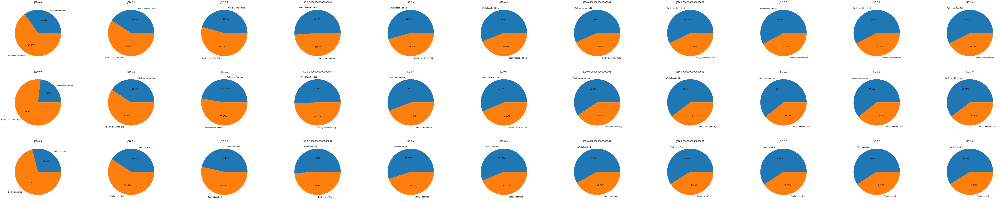

************************************************************************************************************************


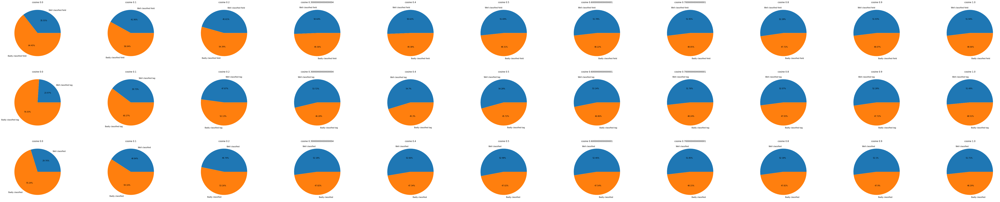

************************************************************************************************************************


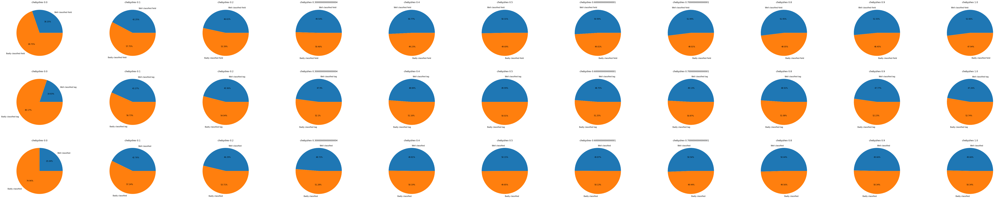

************************************************************************************************************************


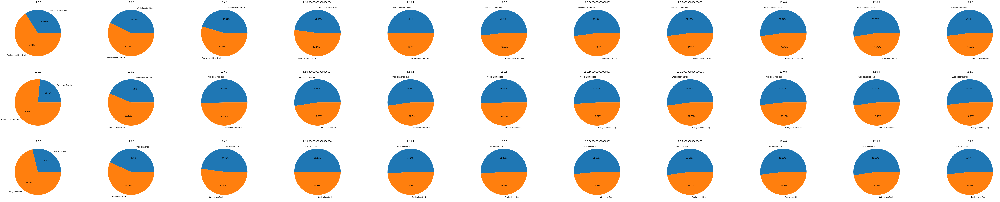

************************************************************************************************************************


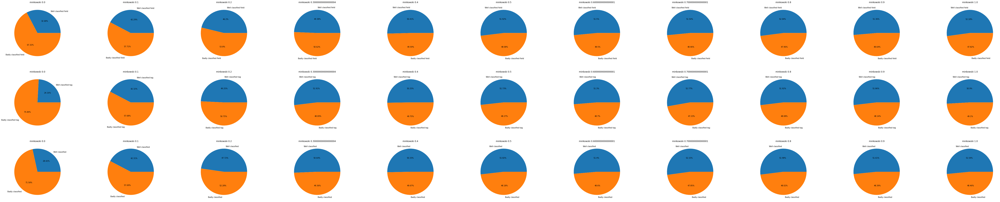

************************************************************************************************************************


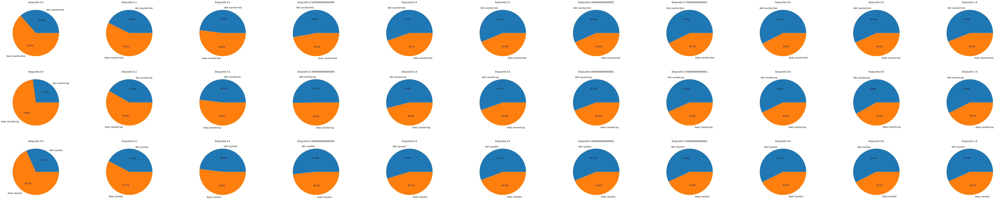

************************************************************************************************************************


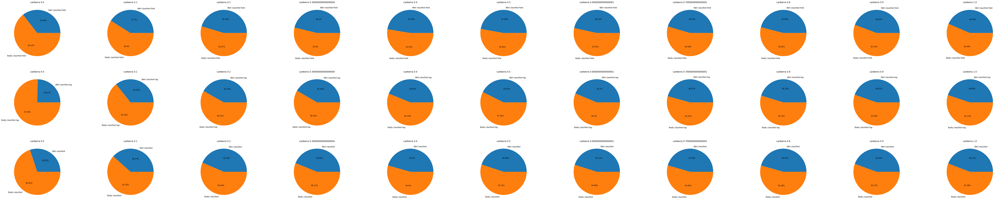

************************************************************************************************************************


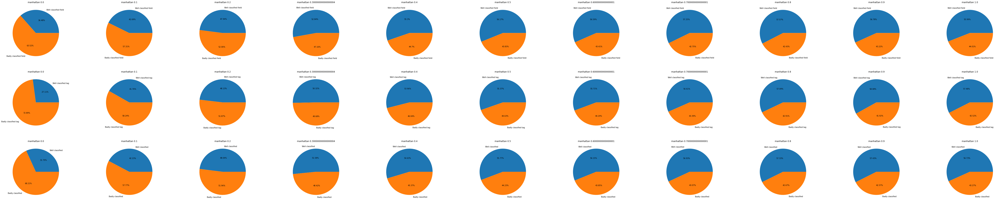

************************************************************************************************************************


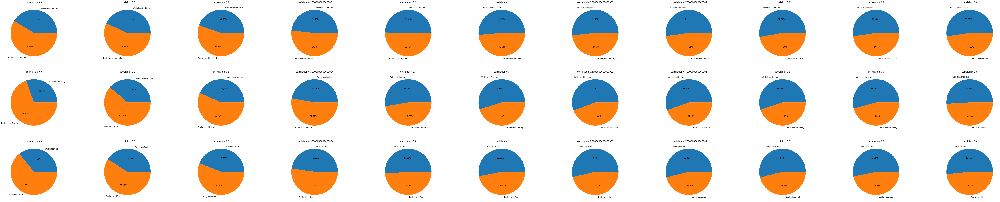

************************************************************************************************************************


In [12]:
for measure in measures:
    
    # create a figure with two subplots
    fig, ax = plt.subplots(3,11, figsize=(100, 20))
    
    # plot each pie chart in a separate subplot
    for j, weight in enumerate(np.linspace(0,1,11)):
        ax[0][j].pie(classified_field_pie[measure][j], labels = ["Well classified field","Badly classified field"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[0][j].set_title(measure + " " + str(weight))
        ax[1][j].pie(classified_tag_pie[measure][j], labels = ["Well classified tag","Badly classified tag"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[1][j].set_title(measure + " " + str(weight))
        ax[2][j].pie([field+tag for field,tag in zip(classified_field_pie[measure][j],classified_tag_pie[measure][j])], labels = ["Well classified","Badly classified"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[2][j].set_title(measure + " " + str(weight))
    plt.show()
    print(120*"*")

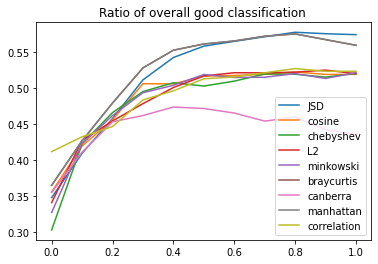

In [13]:
for measure in measures:
    temp = [(field[0] )/(field[0]  + field[1] ) for field,tag in zip(classified_field_pie[measure],classified_tag_pie[measure])]
    plt.plot(np.linspace(0,1,11),temp,label = measure)
plt.legend() 
plt.title("Ratio of overall good classification ")
plt.show()

In [14]:
best_measure = [(field[0] )/(field[0]  + field[1] ) for field,tag in zip(classified_field_pie["JSD"],classified_tag_pie["JSD"])]
best_measure

[0.34753845033796404,
 0.409349957863211,
 0.4578931035871517,
 0.5117306371574275,
 0.5428757277430505,
 0.5586719033081603,
 0.565377633575584,
 0.5718477219338484,
 0.5780822262050868,
 0.5760328814753686,
 0.5746907806974473]

In [16]:
with open('Saved Data/best_measure3_V1', 'wb') as f:
    pickle.dump(best_measure, f)

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,

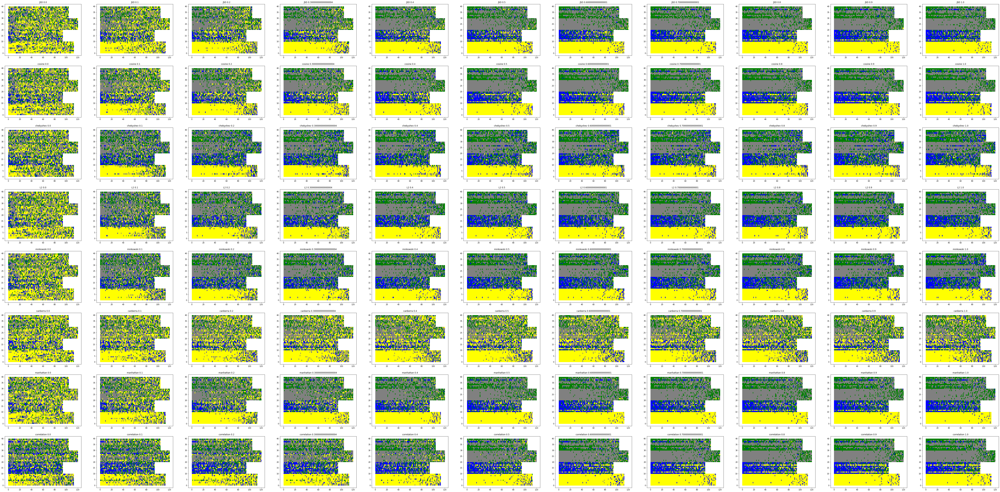

In [11]:
fig, ax = similarity.repartition_similarity(data_eval, measures)

In [12]:
fig.savefig("Saved Data/repartition3_V1")